## **Introduction to the Problem**

With the current boom in artificial intelligence, video manipulation algorithms have reached unprecedented levels of sophistication and subtlety. This evolution presents serious challenges in cybersecurity, identity verification, fraud detection, and social engineering. In recent years, cybercrimes involving deepfake technology have become increasingly common. Both small businesses and large corporations face potential losses amounting to millions — or even billions — of dollars annually due to such attacks.

Political instability is also exacerbated by the spread of fake news. Manipulated videos, images, and audio — often indistinguishable from genuine content — fuel misinformation, erode public trust, and are weaponized for manipulation, defamation, extortion, hate speech, and, in the most severe cases, incitement to violence.

<div align="center">
  <img src="./Images/faceswap.gif" width="300" style="margin-right:20px;"/>
  <img src="./Images/face2face.gif" width="300"/>
  <br>
  <strong>FACESWAP</strong>                                        <strong>FACE2FACE</strong>
</div>

<br>

<div align="center">
  <img src="./Images/neuraltextures.gif" width="300" style="margin-right:20px;"/>
  <img src="./Images/faceshifter.gif" width="300"/>
  <br>
  <strong>NEURAL TEXTURES</strong>                           <strong>FACESHIFTER</strong>
</div>



# **Relevance and Applications**
This growing concern demands equally sophisticated detection methods. Reliable solutions are needed across a wide range of domains: news outlets, journalists, web developers, HR departments, government agencies, and even private individuals. Everyone stands to benefit from tools capable of accurately detecting manipulated content.

# **Objetive of This Work**

In this project, we focus on deepfakes applied to video and images. We begin by exploring facial feature extraction techniques: face detection, tracking, segmentation, mask generation, and landmark extraction.
Next, we analyze various approaches to deepfake detection, ranging from traditional machine learning algorithms and basic convolutional networks to more advanced models such as XceptionNet. We also review some commercially available state-of-the-art detection tools.
Finally, we attempt to generate our own deepfakes using different Generative Adversarial Network (GAN) architectures and compare our results to those produced by the most advanced existing methods.

# **Get the Data**
###  DataSet Description
For this project, we selected a widely used benchmark dataset for evaluating state-of-the-art deepfake detection models: [FaceForensics++](https://github.com/ondyari/FaceForensics/tree/master). This dataset consists of 1,000 pristine (unaltered) short video sequences (each under 50 seconds in duration), along with 4,000 manipulated versions generated using four different deepfake techniques:

* Face2Face

* FaceSwap

* FaceShifter

* Neural Textures

Each method contributes 1,000 manipulated videos, resulting in a total of 5,000 video sequences.
<div align="center"> <img src="./Images/teaser.png" alt="FaceForensics++ dataset teaser"> </div>


### Subset Selection and Download Instructions
Given the volume of data, for this study we focus exclusively on the FaceSwap class for deepfake detection. To download the necessary files, the following commands should be executed from the directory containing the FF++_download.py script:

```bash
python FF++_download.py /home/jpcha/TFM/ADNE/FF++ -d original -c c23 --server EU2
python FF++_download.py /home/jpcha/TFM/ADNE/FF++ -d FaceSwap -c c23 --server EU2
```

### Parameter Details

* The first argument is the output path where the dataset will be saved (you should modify this path based on your local setup).

* The -d flag specifies which subset of the dataset to download. In our case, we download both the original (pristine) videos and those manipulated using FaceSwap technology.

* The -c flag sets the compression level, which is important for storage efficiency:

        - c40: ~2 GB for the entire dataset

        - c23: ~8 GB (used in our project)

        - raw: over 500 GB

* The --server flag indicates the download server. Currently, only EU and EU2 are operational.


# **Preprocessing**

### Preparing the Data
To make the FaceForensics++ dataset suitable for training deepfake detection models, the first step involves face extraction from each video. For this task, we use DLIB, a widely adopted toolkit for facial landmark detection and face cropping.

However, before extracting the faces, we ensure that the data is correctly split at the video level. This is crucial to avoid data leakage, especially identity leakage. All manipulated versions of a given original video are kept within the same data split — whether training, validation, or testing — ensuring that no subject appears across multiple subsets.

Once the data splits are established, we proceed to extract faces from the videos. During this step, we also enforce that similar or near-identical frames are not shared across different splits, maintaining rigorous data science standards and ensuring that the model does not learn from overlapping content.

### Generating the Splits
The following code generates a .json file that stores the path to every video assigned to each subset (train, validation, and test):

In [1]:
import os
import json
from glob import glob
from sklearn.model_selection import GroupShuffleSplit

class UnionFind:
    def __init__(self):
        self.parent = {}
    def find(self, x):
        # path-compressed find
        if x not in self.parent:
            self.parent[x] = x
        if self.parent[x] != x:
            self.parent[x] = self.find(self.parent[x])
        return self.parent[x]
    def union(self, a, b):
        ra, rb = self.find(a), self.find(b)
        if ra != rb:
            self.parent[rb] = ra

def get_video_ids(path: str) -> list[str]:
    """
    Parses '001.mp4'   -> ['001']
           '001_002.mp4' -> ['001','002']
    """
    base = os.path.splitext(os.path.basename(path))[0]
    return base.split('_')

def split_videos_to_json(
    real_dir: str,
    fake_dir: str,
    out_path: str = "splits.json",
    splits: tuple = (0.72, 0.14, 0.14),
    seed: int = 42
):
    # 1) Gather video lists
    real_videos = sorted(glob(os.path.join(real_dir, "*.mp4")))
    fake_videos = sorted(glob(os.path.join(fake_dir, "*.mp4")))
    all_videos = real_videos + fake_videos
    labels     = [0]*len(real_videos) + [1]*len(fake_videos)

    # 2) Build clusters via union-find on the underlying IDs
    uf = UnionFind()
    for vid in all_videos:
        ids = get_video_ids(vid)
        # union all IDs within this video
        for i in range(1, len(ids)):
            uf.union(ids[0], ids[i])

    # 3) Assign each video to the cluster root of its first ID
    groups = [uf.find(get_video_ids(vid)[0]) for vid in all_videos]

    # 4) First split: train vs tmp
    train_frac, val_frac, test_frac = splits
    gss1 = GroupShuffleSplit(n_splits=1, train_size=train_frac, random_state=seed)
    train_idx, tmp_idx = next(gss1.split(all_videos, labels, groups))

    # 5) Second split on the remainder: val vs test
    rel_val = val_frac / (val_frac + test_frac)
    tmp_videos = [all_videos[i] for i in tmp_idx]
    tmp_labels = [labels[i] for i in tmp_idx]
    tmp_groups = [groups[i] for i in tmp_idx]

    gss2 = GroupShuffleSplit(n_splits=1, train_size=rel_val, random_state=seed)
    val_rel_idx, test_rel_idx = next(gss2.split(tmp_videos, tmp_labels, tmp_groups))
    val_idx  = [tmp_idx[i] for i in val_rel_idx]
    test_idx = [tmp_idx[i] for i in test_rel_idx]

    # 6) Build the JSON structure
    splits_dict = {
        "train": {"real": [], "fake": []},
        "val":   {"real": [], "fake": []},
        "test":  {"real": [], "fake": []},
    }

    def assign(split_name, indices, source_list, source_labels):
        for i in indices:
            path = source_list[i]
            cls  = "real" if source_labels[i] == 0 else "fake"
            splits_dict[split_name][cls].append(path)

    assign("train", train_idx, all_videos, labels)
    assign("val",   val_idx,   all_videos, labels)
    assign("test",  test_idx,  all_videos, labels)

    # 7) Sanity check: no cluster root appears in more than one split
    def cluster_set(split_name):
        vids = splits_dict[split_name]["real"] + splits_dict[split_name]["fake"]
        return set(uf.find(get_video_ids(v)[0]) for v in vids)

    t, v, te = cluster_set("train"), cluster_set("val"), cluster_set("test")
    assert t.isdisjoint(v) and t.isdisjoint(te) and v.isdisjoint(te), "Data leakage detected!"

    # 8) Dump to JSON
    with open(out_path, "w") as f:
        json.dump(splits_dict, f, indent=2)

    print(f"Saved splits to {out_path}")


In [2]:
REAL_DIR = "./FF++/original_sequences/youtube/c23/videos"
FAKE_DIR = "./manipulated_sequences/FaceSwap/c23/videos"
split_videos_to_json(REAL_DIR,FAKE_DIR)

Saved splits to splits.json


### Face Extraction
We now run the script that processes every 5th frame of all video sequences. For each selected frame, the script detects all visible faces and extracts the one with the largest bounding box — typically corresponding to the main subject. The extracted face is then cropped and aligned to a standardized resolution of 256×256 pixels.

Although the script also supports the extraction of facial landmarks and segmentation masks, we opt not to include them at this stage in order to minimize storage overhead for the project

In [ ]:
!python face_extractor.py --splits splits.json --out ./FF++


🗂 Extracting split 'train' (1440 videos) to: /home/jpcha/TFM/ADNE/FF++/train
train: 100%|█| 1440/1440 [5:19:08<00:00, 13.30s/it, faces=132472, size=2231.2 MB
✅ Split 'train' done: 132472 faces, ~2231.2 MB

🗂 Extracting split 'val' (280 videos) to: /home/jpcha/TFM/ADNE/FF++/val
val: 100%|██████| 280/280 [1:11:37<00:00, 15.35s/it, faces=26734, size=454.2 MB]
✅ Split 'val' done: 26734 faces, ~454.2 MB

🗂 Extracting split 'test' (280 videos) to: /home/jpcha/TFM/ADNE/FF++/test
test: 100%|█████| 280/280 [1:00:16<00:00, 12.92s/it, faces=24465, size=415.3 MB]
✅ Split 'test' done: 24465 faces, ~415.3 MB


# **Data Exploratory Analysis & Feature Extraction**
With all face images successfully extracted, we proceed to explore a variety of feature extraction techniques. These include:

* RGB value histograms

* Histogram of Oriented Gradients (HOG)

* Image filters

* Facial detection algorithms

* Segmentation and masking

* Facial landmark extraction

* Pixel intensity distribution

* Frequency domain analysis using Fast Fourier Transform (FFT)


When working with visual data such as faces, macro-level analysis across the entire dataset often fails to capture meaningful patterns or artifacts. Instead, the most valuable insights tend to emerge through fine-grained, per-image exploration. By examining individual face samples, we can observe subtle cues — such as compression artifacts, texture inconsistencies, and boundary anomalies — that may reveal the synthetic nature of manipulated images.* 

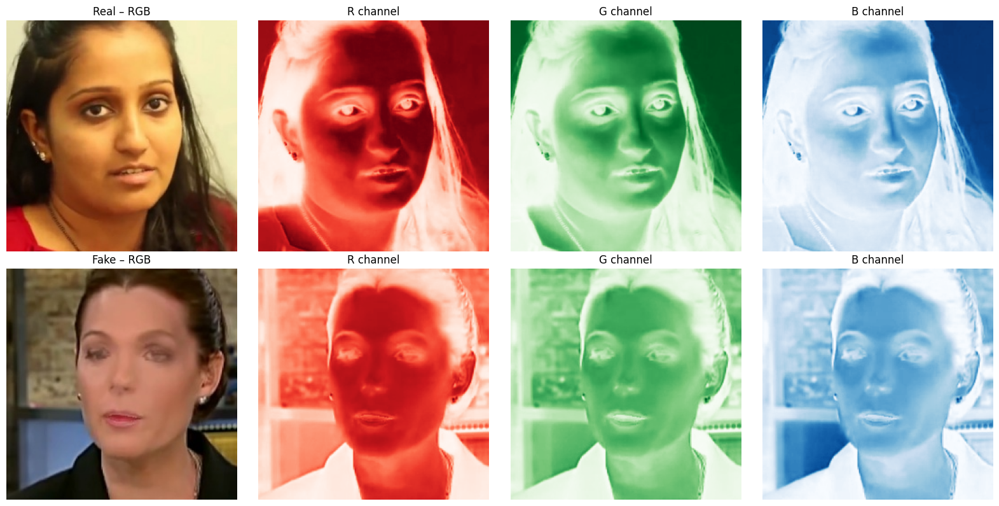

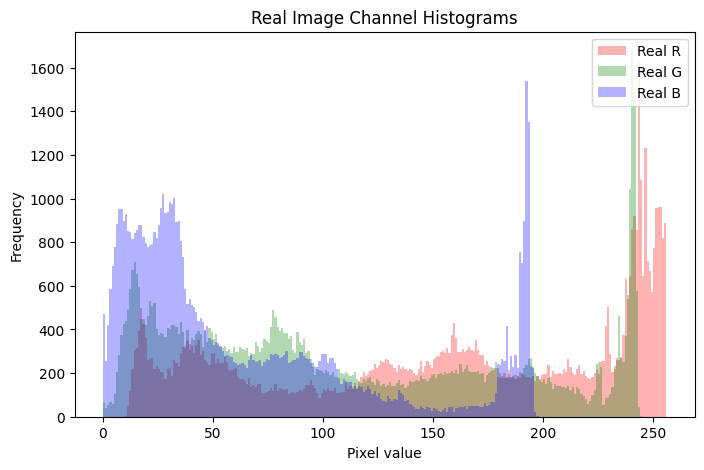

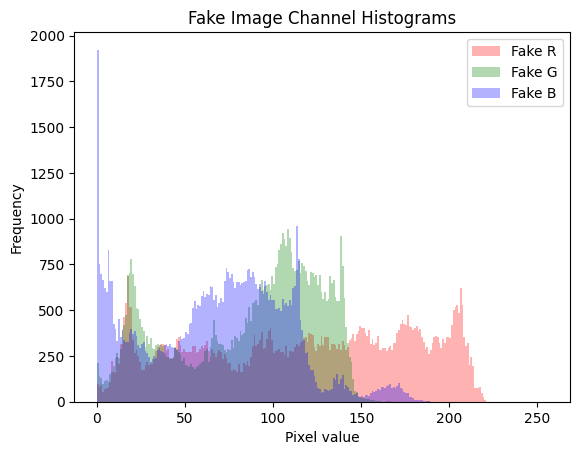

In [ ]:
import os, random
import cv2
import numpy as np
import matplotlib.pyplot as plt
random.seed(42)
# roots
REAL_ROOT = "./FF++/train/real"
FAKE_ROOT = "./FF++/train/fake"

# pick one random real & fake
real_path = os.path.join(REAL_ROOT, random.choice(os.listdir(REAL_ROOT)))
fake_path = os.path.join(FAKE_ROOT, random.choice(os.listdir(FAKE_ROOT)))

def load_rgb(path):
    bgr = cv2.imread(path)
    if bgr is None:
        raise FileNotFoundError(path)
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

real = load_rgb(real_path)
fake = load_rgb(fake_path)

# split channels
r_real, g_real, b_real = real[:,:,0], real[:,:,1], real[:,:,2]
r_fake, g_fake, b_fake = fake[:,:,0], fake[:,:,1], fake[:,:,2]

# ---- plot images + channels ----
fig, axs = plt.subplots(2, 4, figsize=(16,8))

for row, (img, r, g, b, title) in enumerate([
    (real, r_real, g_real, b_real, "Real"),
    (fake, r_fake, g_fake, b_fake, "Fake")
]):
    axs[row,0].imshow(img)
    axs[row,0].set_title(f"{title} – RGB")
    axs[row,0].axis("off")

    axs[row,1].imshow(r, cmap="Reds")
    axs[row,1].set_title("R channel")
    axs[row,1].axis("off")

    axs[row,2].imshow(g, cmap="Greens")
    axs[row,2].set_title("G channel")
    axs[row,2].axis("off")

    axs[row,3].imshow(b, cmap="Blues")
    axs[row,3].set_title("B channel")
    axs[row,3].axis("off")

plt.tight_layout()
plt.show()

# ---- combined histograms ----
plt.figure(figsize=(8,5))
bins = np.arange(257)
plt.hist(r_real.ravel(), bins=bins, color='r', alpha=0.3, label='Real R')
plt.hist(g_real.ravel(), bins=bins, color='g', alpha=0.3, label='Real G')
plt.hist(b_real.ravel(), bins=bins, color='b', alpha=0.3, label='Real B')
plt.title("Real Image Channel Histograms")
plt.xlabel("Pixel value")
plt.ylabel("Frequency")
plt.legend(loc='upper right')
plt.show()
plt.hist(r_fake.ravel(), bins=bins, color='r', alpha=0.3, label='Fake R')
plt.hist(g_fake.ravel(), bins=bins, color='g', alpha=0.3, label='Fake G')
plt.hist(b_fake.ravel(), bins=bins, color='b', alpha=0.3, label='Fake B')
plt.title("Fake Image Channel Histograms")
plt.xlabel("Pixel value")
plt.ylabel("Frequency")
plt.legend(loc='upper right')
plt.show()


### Real Image

The histogram for the real face image shows strong peaks in the Red and Green channels near the high-intensity range (around 240–255), indicating highlights or strong lighting. The Blue channel peaks around lower values, typical of shadows or warm-toned areas. The distribution overall is varied and rich in contrast.

### Fake Image

In contrast, the fake image shows a more compressed intensity distribution, especially in the Red channel. The Green channel has noticeable accumulations in the mid-range, and the Blue channel appears denser in the lower range, but without strong localized peaks. These patterns suggest smoother color transitions common in generated content.

# **HOG: Histogram of Gradients**

The HOG descriptor captures the structure and shape of objects in the image by computing the distribution of gradient orientations over localized patches. In the visualization on the right, we can clearly see the prominent edges of the face — particularly around the eyes, nose, mouth, and jawline.

This type of feature representation is useful for highlighting subtle geometric patterns, which can help differentiate real faces from generated ones, especially in regions where synthetic textures may appear overly smooth or lack sharp gradient transitions.

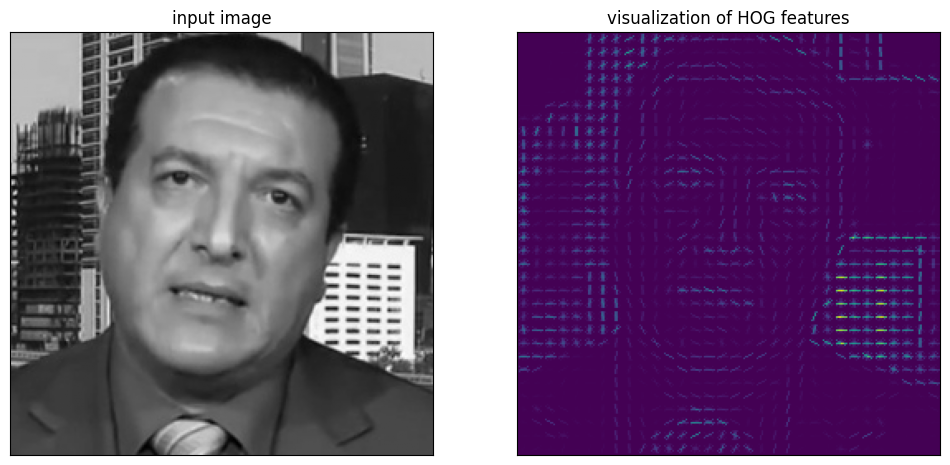

In [ ]:
from skimage import data, color, feature

image = color.rgb2gray(img)
hog_vec, hog_vis = feature.hog(image, visualize=True)

fig, ax = plt.subplots(1, 2, figsize=(12, 6),
                       subplot_kw=dict(xticks=[], yticks=[]))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('input image')

ax[1].imshow(hog_vis)
ax[1].set_title('visualization of HOG features')

## **Face Landmarking, Segmentation, and Masking with DLIB**

Modern deepfake systems rely heavily on **face-agnostic feature extraction** — meaning they often require additional structural information beyond raw pixel data to perform high-fidelity manipulations.

For example:
- **Lip-syncing models** typically require a **mask of the lips and chin** to define the substitution area.
- **Face-swapping techniques** use **facial masks** to precisely define the boundaries of the region to be replaced.
- **Face reenactment methods** rely on **facial landmarks** to puppeteer the target face, transferring expressions and head movements from a source.

<div align="center">
  <img src="./Images/source_target.gif" width="500"/> 
  <img src="./Images/landmarking.gif" width="500"/>
  <img src="./Images/reenactment.gif" width="500"/>
  <img src="./Images/reenact_result.gif" width="500"/>
</div>

---

## **Landmark Detection with DLIB**

**DLIB** is a C++-based toolkit widely used for computer vision and machine learning applications. One of its core strengths is its ability to detect **facial landmarks** — specific reference points that map key facial features.

DLIB provides two commonly used pretrained models:
- **68-point detector**
- **81-point detector**

Internally, DLIB uses a **cascaded regression tree** approach. It starts with an initial estimate of landmark positions and iteratively refines them by predicting small displacements based on local pixel intensity patterns. This process continues until the landmarks accurately align with the actual facial geometry — conceptually similar to **unsupervised clustering**.

To generate **segmentation masks** or define **facial regions**, landmarks can be grouped and connected into **convex hulls**. For example:
- Points **27–36** outline the **nose**
- Points **48–68** define the **mouth**
- Other regions like the eyes, jawline, and eyebrows are similarly mapped using well-known subsets of landmark points

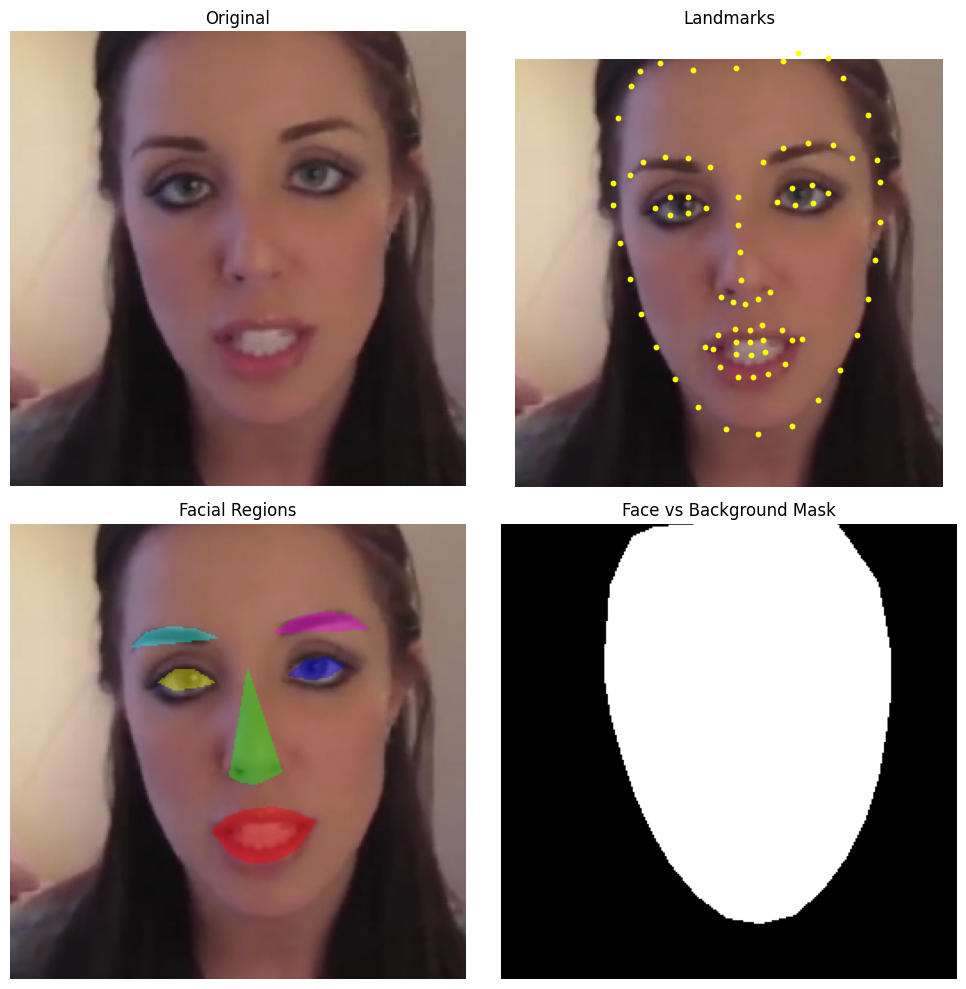

In [16]:
import os
import random
import cv2
import dlib
import numpy as np
import matplotlib.pyplot as plt

# only the 6 “standard” regions
REGIONS = {
    'mouth':         list(range(48, 68)),
    'nose':          list(range(27, 36)),
    'left_eye':      list(range(42, 48)),
    'right_eye':     list(range(36, 42)),
    'left_eyebrow':  list(range(22, 27)),
    'right_eyebrow': list(range(17, 22)),
}

# colors for overlay
REGION_COLORS = {
    'mouth':         (1.0, 0.0, 0.0),
    'nose':          (0.0, 1.0, 0.0),
    'left_eye':      (0.0, 0.0, 1.0),
    'right_eye':     (1.0, 1.0, 0.0),
    'left_eyebrow':  (1.0, 0.0, 1.0),
    'right_eyebrow': (0.0, 1.0, 1.0),
}

def segment_landmarks_and_regions(image_path, predictor_path):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise FileNotFoundError(image_path)
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    detector = dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor(predictor_path)
    dets = detector(gray)
    if not dets:
        raise RuntimeError("No face detected")
    face = dets[0]

    shape = predictor(gray, face)
    landmarks = np.array([[p.x, p.y] for p in shape.parts()])

    h, w = gray.shape
    # 1) region‐by‐region masks
    masks = {}
    for name, idxs in REGIONS.items():
        pts = landmarks[idxs]
        hull = cv2.convexHull(pts)
        m = np.zeros((h, w), np.uint8)
        cv2.fillConvexPoly(m, hull, 255)
        masks[name] = m

    # 2) overall face mask: hull of all 68 points
    full_hull = cv2.convexHull(landmarks)
    face_mask = np.zeros((h, w), np.uint8)
    cv2.fillConvexPoly(face_mask, full_hull, 255)

    return img_bgr, landmarks, masks, face_mask

if __name__ == "__main__":
    predictor_path = "/home/jpcha/TFM/ADNE/dlib_tools/shape_predictor_81_face_landmarks.dat"
    REAL_DIR = "/home/jpcha/TFM/ADNE/FF++/test/real"
    img_path = os.path.join(REAL_DIR, random.choice(os.listdir(REAL_DIR)))

    img_bgr, landmarks, regions, face_mask = segment_landmarks_and_regions(img_path, predictor_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) / 255.0

    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    # Panel 1: original
    axes[0][0].imshow(img_rgb)
    axes[0][0].set_title("Original")
    axes[0][0].axis("off")

    # Panel 2: landmarks
    axes[0][1].imshow(img_rgb)
    axes[0][1].scatter(landmarks[:,0], landmarks[:,1], s=10, c="yellow")
    axes[0][1].set_title("Landmarks")
    axes[0][1].axis("off")

    # Panel 3: region overlays
    axes[1][0].imshow(img_rgb)
    for name, mask in regions.items():
        color = REGION_COLORS[name]
        rgba = np.zeros((*mask.shape, 4), float)
        rgba[..., :3] = color
        rgba[..., 3] = (mask>0) * 0.4
        axes[1][0].imshow(rgba)
    axes[1][0].set_title("Facial Regions")
    axes[1][0].axis("off")

    # Panel 4: binary face mask
    axes[1][1].imshow(face_mask, cmap="gray")
    axes[1][1].set_title("Face vs Background Mask")
    axes[1][1].axis("off")

    plt.tight_layout()
    plt.show()


## **Frequency Artifacts and the Role of Fourier Analysis**

Some advanced detection models focus on identifying **subtle artifacts** that serve as fingerprints of synthetic content. These artifacts are often enhanced during preprocessing to facilitate better representation learning. Common examples include:

- **Blending boundaries** between swapped face regions
- **Checkerboard artifacts** introduced by certain GAN-based upsampling methods
- **Unnatural patterns** in pixel intensity distribution unique to generated images

For frequency-based detection methods, the **Fourier Transform (FT)** is a valuable tool. It allows us to analyze and visualize the distribution of pixel intensities across different frequency components in an image.

Typically:
- **Authentic (real) images** show **smooth and organically distributed frequencies**
- **Manipulated (fake) images** often contain **distinct, high-frequency anomalies** related to the generation process

To highlight these high-frequency details, we apply the **Fast Fourier Transform (FFT)** to each image and crop out the central low-frequency region. This focuses the visualization on the **higher-frequency components**, where artifacts are more likely to appear.

The following examples illustrate these differences.

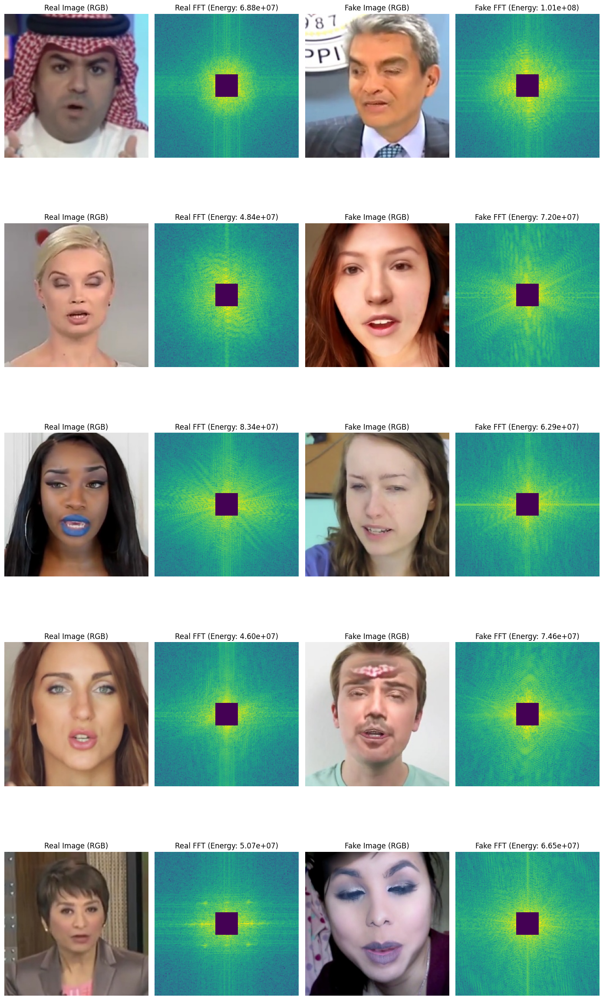

Average Real FFT Energy: 5.95e+07
Average Fake FFT Energy: 7.53e+07


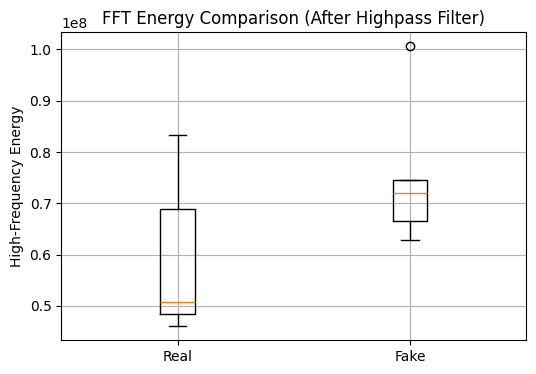

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import random
import cv2  # for easier high-pass filtering

def load_image(path, mode='RGB'):
    img = Image.open(path).convert(mode)
    img = np.array(img)
    return img

def apply_highpass(img, sigma=3):
    """Apply a simple high-pass filter using Gaussian blur subtraction."""
    if len(img.shape) == 3:
        img_gray = np.mean(img, axis=2)
    else:
        img_gray = img

    blurred = cv2.GaussianBlur(img_gray, (0, 0), sigmaX=sigma, sigmaY=sigma)
    highpass = img_gray - blurred
    return highpass

def compute_fft(image):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.abs(fshift)
    return magnitude_spectrum

def crop_high_frequencies(magnitude_spectrum, crop_size=20):
    h, w = magnitude_spectrum.shape
    cy, cx = h // 2, w // 2
    mask = np.ones_like(magnitude_spectrum)
    mask[cy-crop_size:cy+crop_size, cx-crop_size:cx+crop_size] = 0
    cropped = magnitude_spectrum * mask
    return cropped

def energy_score(magnitude_spectrum):
    return np.sum(magnitude_spectrum)

def show_and_analyze(real_img_paths, fake_img_paths, crop_size=30, sigma=3):
    real_scores = []
    fake_scores = []

    n = len(real_img_paths)
    plt.figure(figsize=(14, 5 * n))

    for i, (real_path, fake_path) in enumerate(zip(real_img_paths, fake_img_paths)):
        real = load_image(real_path, mode='RGB')
        fake = load_image(fake_path, mode='RGB')

        # Apply high-pass filter first
        real_highpass = apply_highpass(real, sigma=sigma)
        fake_highpass = apply_highpass(fake, sigma=sigma)

        # Then compute FFT on highpass images
        real_fft = compute_fft(real_highpass)
        fake_fft = compute_fft(fake_highpass)

        real_fft_cropped = crop_high_frequencies(real_fft, crop_size)
        fake_fft_cropped = crop_high_frequencies(fake_fft, crop_size)

        # Compute energy scores
        real_energy = energy_score(real_fft_cropped)
        fake_energy = energy_score(fake_fft_cropped)

        real_scores.append(real_energy)
        fake_scores.append(fake_energy)

        # Real Image
        plt.subplot(n, 4, i * 4 + 1)
        plt.title('Real Image (RGB)')
        plt.imshow(real)
        plt.axis('off')

        # Real FFT
        plt.subplot(n, 4, i * 4 + 2)
        plt.title(f'Real FFT (Energy: {real_energy:.2e})')
        plt.imshow(np.log1p(real_fft_cropped), cmap='viridis')
        plt.axis('off')

        # Fake Image
        plt.subplot(n, 4, i * 4 + 3)
        plt.title('Fake Image (RGB)')
        plt.imshow(fake)
        plt.axis('off')

        # Fake FFT
        plt.subplot(n, 4, i * 4 + 4)
        plt.title(f'Fake FFT (Energy: {fake_energy:.2e})')
        plt.imshow(np.log1p(fake_fft_cropped), cmap='viridis')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # After visualizing, print average energies
    print(f"Average Real FFT Energy: {np.mean(real_scores):.2e}")
    print(f"Average Fake FFT Energy: {np.mean(fake_scores):.2e}")

    # Show boxplot comparison
    plt.figure(figsize=(6, 4))
    plt.boxplot([real_scores, fake_scores], tick_labels=['Real', 'Fake'])
    plt.ylabel('High-Frequency Energy')
    plt.title('FFT Energy Comparison (After Highpass Filter)')
    plt.grid(True)
    plt.show()

# Paths
REAL_ROOT = "/home/jpcha/TFM/ADNE/FF++/train/real"
FAKE_ROOT = "/home/jpcha/TFM/ADNE/FF++/train/fake"

# How many examples to show
N_EXAMPLES = 5

# Pick random real & fake images
real_img_paths = [os.path.join(REAL_ROOT, fname) for fname in random.sample(os.listdir(REAL_ROOT), N_EXAMPLES)]
fake_img_paths = [os.path.join(FAKE_ROOT, fname) for fname in random.sample(os.listdir(FAKE_ROOT), N_EXAMPLES)]

# Analyze
show_and_analyze(real_img_paths, fake_img_paths, crop_size=20, sigma=7)


- Fake images tend to show **higher average high-frequency energy** than real ones.
- This suggests the presence of unnatural signal components introduced during synthesis, which often accumulate in the **outer spectrum bands**.
- These patterns can serve as useful features for deepfake detection models based on frequency analysis.

## **Baseline: Machine Learning Approach for Face Segmentation**

It is entirely feasible to perform **image segmentation using traditional machine learning models**, provided that proper **feature engineering** is applied. Since image data is inherently high-dimensional, it must be carefully preprocessed to enable classical models to perform effective classification.

In this baseline, we train a **Random Forest classifier** to predict whether a given region of an image belongs to a **face** or to the **background**.


### Superpixel-Based Representation

To simplify the learning task, we use **superpixels** — groups of neighboring pixels with similar color, texture, and brightness. Each image is segmented into **50 superpixels**, and a set of features is extracted from each region.



### Feature Set

For each superpixel, we extract the following features:

- **Color**: Mean and variance of R, G, and B channels → **6 features**
- **Texture**: Local Binary Pattern (LBP) histogram with 8 bins → **8 features**
- **Edge Density**: Mean response to Sobel operator → **1 feature**

**Total**: 6 + 8 + 1 = **15 real-valued features per superpixel**



### Ground Truth Definition

The ground truth masks are derived using **DLIB's facial landmark detector** on a subset of the dataset. A superpixel is assigned a label of **1 (face)** if the **majority of its pixels overlap** with the corresponding ground truth mask, and **0 (background)** otherwise.


### Data Preparation

The following script extracts **frames and binary masks** from **80 videos** in the dataset. These frames are kept in their original resolution at this stage. Later, during training, we will **downsample them** to reduce memory usage.

In [ ]:
!python mask_extractor.py \
 --video_dir ./FF++/original_sequences/youtube/c23/videos \
 --output_dir ./ml_data \
 --predictor ./dlib_tools/shape_predictor_68_face_landmarks.dat \
 --num_videos 80

Samples extracted: 100%|█| 38296/38296 [4:05:16<00:00,  2.60sample/s, samples=38


### To give us an idea of what these superpixels could look like in a given image:

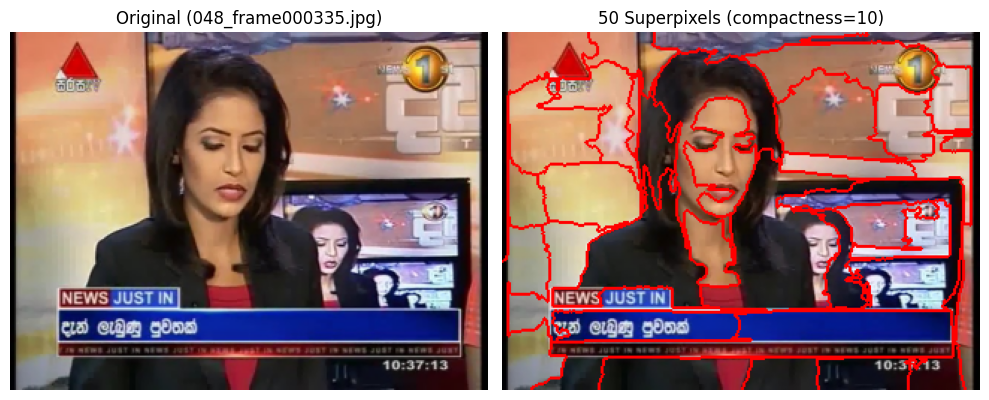

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from skimage import io, transform, segmentation, color
from skimage.segmentation import mark_boundaries

# ─── CONFIG ────────────────────────────────────────────────────────────────────
IMG_DIR      = "./ml_data/frames"    
DOWNSCALE    = 0.5                   
N_SEGMENTS   = 50
COMPACTNESS  = 10
# ────────────────────────────────────────────────────────────────────────────────

# Pick a random test image
fn = random.choice([f for f in os.listdir(IMG_DIR) if f.endswith(".jpg")])
img = io.imread(os.path.join(IMG_DIR, fn))

# Optionally downscale for speed
h, w = img.shape[:2]
img_small = transform.resize(
    img, (int(h*DOWNSCALE), int(w*DOWNSCALE)),
    anti_aliasing=True, preserve_range=True
).astype(img.dtype)

# Compute superpixels
segments = segmentation.slic(
    img_small,
    n_segments=N_SEGMENTS,
    compactness=COMPACTNESS,
    start_label=0
)

# Overlay segment boundaries on the image
overlay = mark_boundaries(img_small, segments, color=(1,0,0), mode='thick')

# Show side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(img_small)
ax1.set_title(f"Original ({fn})")
ax1.axis('off')

ax2.imshow(overlay)
ax2.set_title(f"{N_SEGMENTS} Superpixels (compactness={COMPACTNESS})")
ax2.axis('off')

plt.tight_layout()
plt.show()


Building train set...
  → 1005386 superpixels
Building test set...
  → 250892 superpixels
Accuracy: 99.04%  IoU: 0.796
Confusion matrix:
[[239114   1195]
 [  1213   9370]]


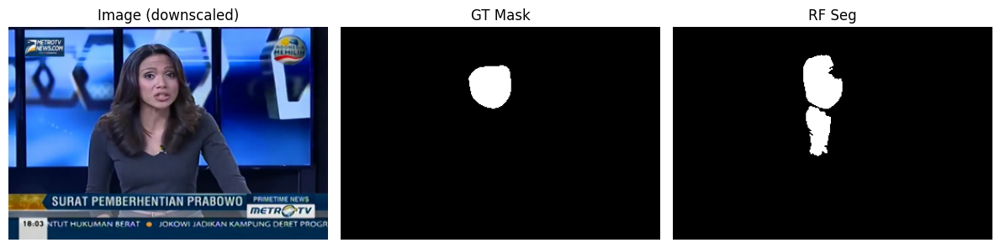

In [ ]:
import os, random
import numpy as np
import matplotlib.pyplot as plt

from skimage import io, color, filters, feature, segmentation, transform
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, jaccard_score
from sklearn.model_selection import train_test_split

# ─── CONFIG ───────────────────────────────────────────────────────────────────
IMG_DIR      = "./ml_data/frames"    # .jpg
MASK_DIR     = "./ml_data/masks"     # .png binary masks
TEST_SIZE    = 0.2
RANDOM_STATE = 42

# Downscale fraction (e.g. 0.5 = half‐size)
DOWNSCALE    = 0.5

N_SEGMENTS   = 50                   
COMPACTNESS  = 10

RF_PARAMS    = dict(n_estimators=100,
                    max_depth=15,
                    random_state=RANDOM_STATE)
# ────────────────────────────────────────────────────────────────────────────────

def extract_superpixel_features(img, segments, mask):
    gray = color.rgb2gray(img)
    lbp  = feature.local_binary_pattern(
        (gray*255).astype(np.uint8), P=8, R=1, method="uniform")
    edge = filters.sobel(gray)

    X, y = [], []
    for sp in np.unique(segments):
        sp_mask = segments==sp
        if not sp_mask.any(): continue

        pixels = img[sp_mask]
        mean_rgb = pixels.mean(axis=0)
        var_rgb  = pixels.var(axis=0)

        lbp_vals = lbp[sp_mask].ravel()
        lbp_hist,_ = np.histogram(lbp_vals, bins=8, range=(0,8), density=True)
        edge_den = edge[sp_mask].mean()

        feat = np.hstack([mean_rgb, var_rgb, lbp_hist, edge_den])
        X.append(feat)

        lbl = (mask[sp_mask] > 128).mean() > 0.5
        y.append(int(lbl))

    return np.array(X), np.array(y)

def build_dataset(file_list):
    X_parts, y_parts = [], []
    for f in file_list:
        # 1) Load full‐size
        img  = io.imread(os.path.join(IMG_DIR, f))
        msk  = io.imread(os.path.join(MASK_DIR, f.replace(".jpg",".png")))

        # 2) Downscale
        h, w = img.shape[:2]
        new_shape = (int(h*DOWNSCALE), int(w*DOWNSCALE))
        img_small = transform.resize(img, new_shape, anti_aliasing=True, preserve_range=True).astype(img.dtype)
        msk_small = transform.resize(msk, new_shape, order=0, preserve_range=True).astype(msk.dtype)

        # 3) Superpixel segmentation on the small image
        segs = segmentation.slic(
            img_small,
            n_segments=N_SEGMENTS,
            compactness=COMPACTNESS,
            start_label=0
        )

        # 4) Extract features on the small image & mask
        feats, labs = extract_superpixel_features(img_small, segs, msk_small)
        X_parts.append(feats)
        y_parts.append(labs)

    X = np.vstack(X_parts)
    y = np.hstack(y_parts)
    return X, y

# ─── MAIN ─────────────────────────────────────────────────────────────────────
imgs = sorted([f for f in os.listdir(IMG_DIR) if f.endswith(".jpg")])
train_f, test_f = train_test_split(imgs, test_size=TEST_SIZE, random_state=RANDOM_STATE)

print("Building train set...")
X_train, y_train = build_dataset(train_f)
print(f"  → {X_train.shape[0]} superpixels")

print("Building test set...")
X_test, y_test   = build_dataset(test_f)
print(f"  → {X_test.shape[0]} superpixels")

# train
clf = RandomForestClassifier(**RF_PARAMS)
clf.fit(X_train, y_train)

# eval
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test, y_pred)
iou = jaccard_score(y_test, y_pred)
print(f"Accuracy: {acc*100:.2f}%  IoU: {iou:.3f}")
print("Confusion matrix:")
print(confusion_matrix(y_test, y_pred))

# visualize on one test image
f = random.choice(test_f)
img_full = io.imread(os.path.join(IMG_DIR, f))
msk_full = io.imread(os.path.join(MASK_DIR, f.replace(".jpg",".png")))

# Downscale for consistent visualization
h, w = img_full.shape[:2]
img_small = transform.resize(img_full, (int(h*DOWNSCALE), int(w*DOWNSCALE)),
                            anti_aliasing=True, preserve_range=True).astype(img_full.dtype)
msk_small = transform.resize(msk_full, (int(h*DOWNSCALE), int(w*DOWNSCALE)),
                            order=0, preserve_range=True).astype(msk_full.dtype)

segs = segmentation.slic(img_small, n_segments=N_SEGMENTS,
                         compactness=COMPACTNESS, start_label=0)
feats, _ = extract_superpixel_features(img_small, segs, msk_small)
preds   = clf.predict(feats)

mask_pred = np.zeros(segs.shape, dtype=np.uint8)
for sp, p in zip(np.unique(segs), preds):
    mask_pred[segs==sp] = p

fig, axs = plt.subplots(1,3,figsize=(12,4))
axs[0].imshow(img_small);        axs[0].set_title("Image (downscaled)");    axs[0].axis("off")
axs[1].imshow(msk_small, cmap="gray"); axs[1].set_title("GT Mask"); axs[1].axis("off")
axs[2].imshow(mask_pred, cmap="gray");  axs[2].set_title("RF Seg");  axs[2].axis("off")
plt.tight_layout()
plt.show()


In [ ]:
from joblib import dump, load
# Training the model takes a while so after training we store the model for persistance in case the kernel crashes and for usage downstream
dump(clf, "RandomForestClassifier.joblib")

clf2 = load("RandomForestClassifier.joblib")



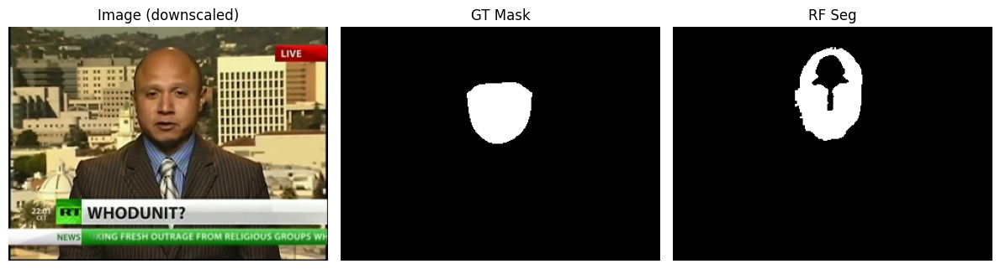

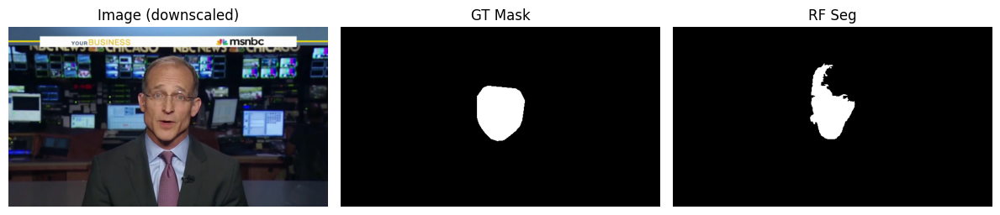

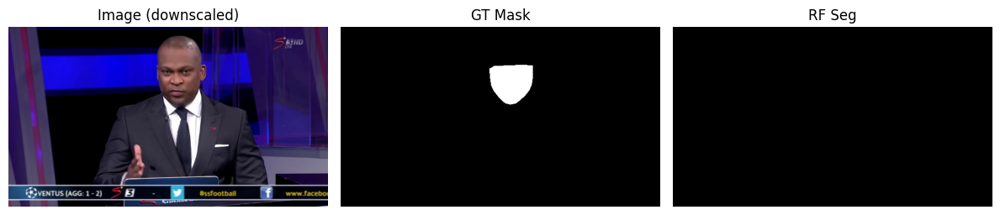

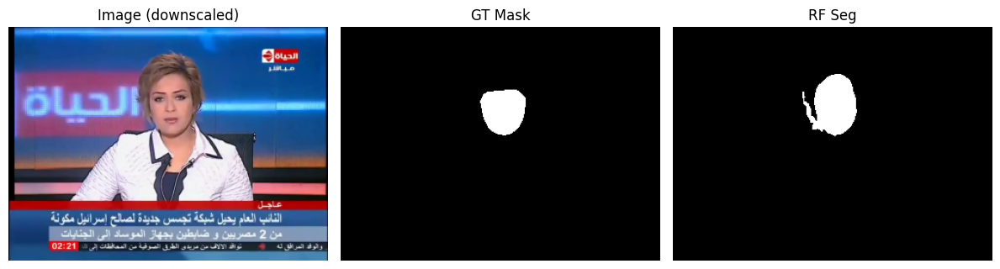

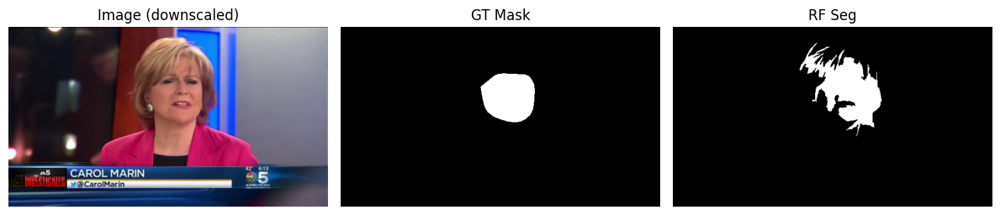

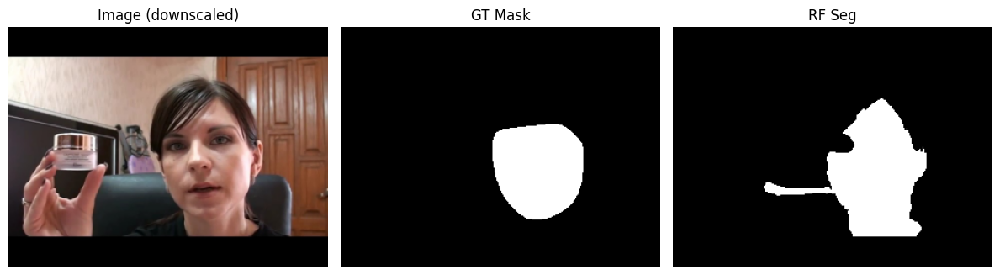

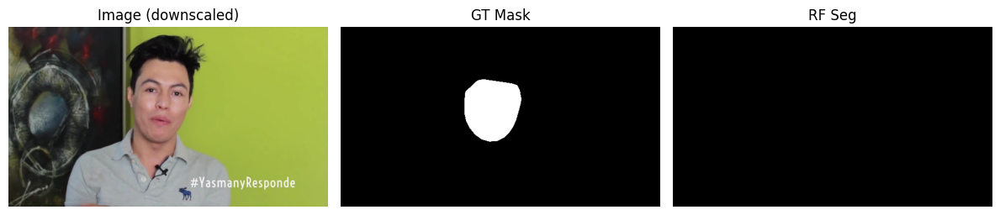

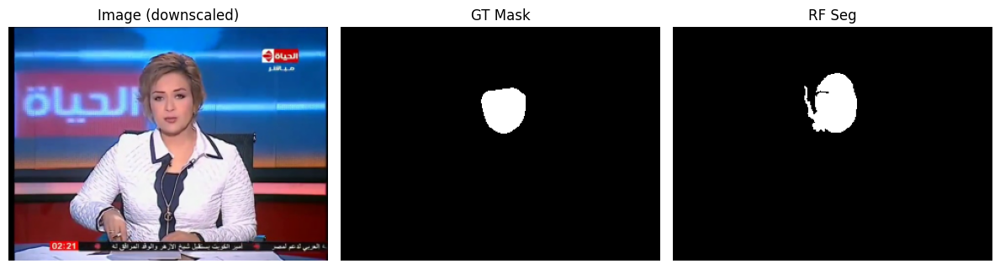

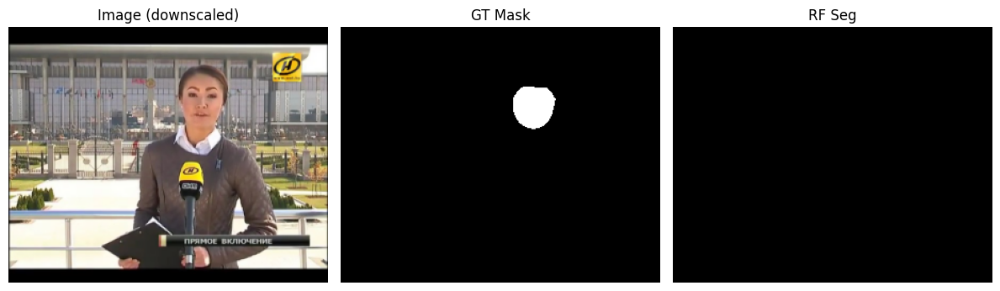

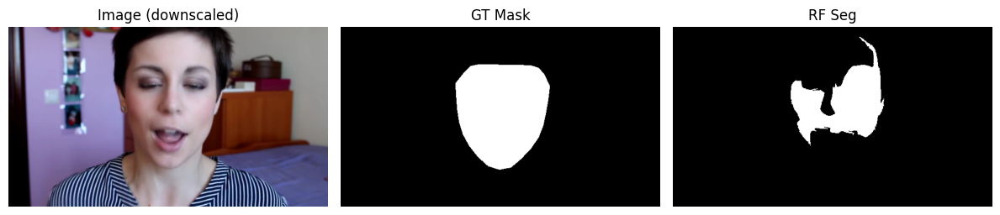

In [6]:
SAMPLES = 10
f = random.sample(test_f, SAMPLES)
for img in f:
    img_full = io.imread(os.path.join(IMG_DIR, img))
    msk_full = io.imread(os.path.join(MASK_DIR, img.replace(".jpg",".png")))

    # Downscale for consistent visualization
    h, w = img_full.shape[:2]
    img_small = transform.resize(img_full, (int(h*DOWNSCALE), int(w*DOWNSCALE)),
                                anti_aliasing=True, preserve_range=True).astype(img_full.dtype)
    msk_small = transform.resize(msk_full, (int(h*DOWNSCALE), int(w*DOWNSCALE)),
                                order=0, preserve_range=True).astype(msk_full.dtype)

    segs = segmentation.slic(img_small, n_segments=N_SEGMENTS,
                            compactness=COMPACTNESS, start_label=0)
    feats, _ = extract_superpixel_features(img_small, segs, msk_small)
    preds   = clf2.predict(feats)

    mask_pred = np.zeros(segs.shape, dtype=np.uint8)
    for sp, p in zip(np.unique(segs), preds):
        mask_pred[segs==sp] = p

    fig, axs = plt.subplots(1,3,figsize=(12,4))
    axs[0].imshow(img_small);        axs[0].set_title("Image (downscaled)");    axs[0].axis("off")
    axs[1].imshow(msk_small, cmap="gray"); axs[1].set_title("GT Mask"); axs[1].axis("off")
    axs[2].imshow(mask_pred, cmap="gray");  axs[2].set_title("RF Seg");  axs[2].axis("off")
    plt.tight_layout()
    plt.show()

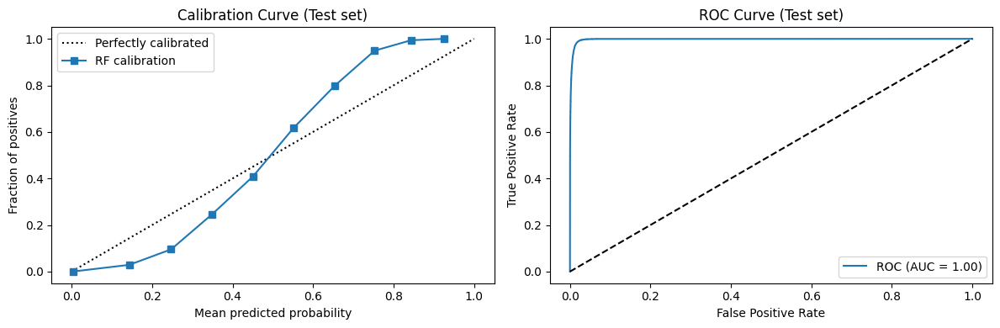

In [ ]:
from sklearn.calibration import calibration_curve
from sklearn.metrics      import roc_curve, auc
import matplotlib.pyplot   as plt

# 1) Get predicted probabilities on the test set
y_prob = clf2.predict_proba(X_test)[:, 1]

fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# 2) Calibration curve
fop, mpv = calibration_curve(y_test, y_prob, n_bins=10, strategy='uniform')
axs[0].plot([0, 1], [0, 1], 'k:', label='Perfectly calibrated')
axs[0].plot(mpv, fop,     's-', label='RF calibration')
axs[0].set_xlabel('Mean predicted probability')
axs[0].set_ylabel('Fraction of positives')
axs[0].set_title('Calibration Curve (Test set)')
axs[0].legend()

# 3) ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc     = auc(fpr, tpr)
axs[1].plot(fpr, tpr, label=f'ROC (AUC = {roc_auc:.2f})')
axs[1].plot([0, 1], [0, 1], 'k--')
axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].set_title('ROC Curve (Test set)')
axs[1].legend()

plt.tight_layout()
plt.show()


### Evaluation of the Random Forest Classifier

The Random Forest classifier performs reasonably well across most face samples. In general, the model is able to **identify the approximate location of the face** within the image, often producing well-shaped masks.

However, several limitations are observed:

- **Over-extension to neck regions**: Since the model relies on pixel value distributions (e.g., skin tone), it often includes the neck area as part of the face, treating all exposed skin as a single region of interest (ROI).

- **Hair occlusions**: Occlusions due to hair introduce **significant noise** into the predicted masks, especially along the forehead and jawline boundaries.

- **Missed detections on small faces**: In some rare cases, especially for **distant or small faces**, the model fails to detect the face entirely. This is likely due to the fixed number of superpixels per image, which makes **each superpixel too small** to capture meaningful features on low-resolution facial regions.

Overall, the model demonstrates a strong ability to **locate facial regions**, but its precision and boundary accuracy are limited by superpixel granularity and the absence of contextual awareness.

## **Deep Learning Approach**

There are several families of models capable of detecting deepfakes, each relying on different principles. These approaches can be broadly categorized as **Naive**, **Spatial**, **Temporal**, **Frequentist**, or **Biometric**, depending on the type of features they exploit. Some advanced implementations combine **spatial and temporal pipelines** to perform **spatio-temporal analysis**.

| Category        | Pros                                                                 | Cons                                                                 | Example Techniques / Papers                                                   |
|-----------------|----------------------------------------------------------------------|----------------------------------------------------------------------|--------------------------------------------------------------------------------|
| **Naive**       | - Extremely fast and easy to implement<br>- Low computational cost   | - Very low accuracy in real-world scenarios<br>- No learning of patterns | - Pixel-difference thresholds<br>- Color histogram outliers                     |
| **Spatial**     | - Learns fine-grained CNN features<br>- High frame-level accuracy    | - Ignores temporal coherence<br>- Risk of overfitting to artifacts   | - XceptionNet-based classifiers (e.g., FaceForensics++)                         |
| **Temporal**    | - Detects flickering/inconsistencies across frames<br>- Noise-robust | - Requires full video clips<br>- Higher memory and compute demands  | - CNN+RNN architectures<br>- Optical flow analysis (e.g., STIL)                |
| **Frequentist** | - Captures spectral artifacts<br>- Complements spatial methods       | - Loses spatial locality<br>- Sensitive to compression/downsampling | - Patch-wise DFT/DCT analysis (e.g., F3Net)                                    |
| **Biometric**   | - Leverages physiological cues (blinks, pulse)<br>- Harder to spoof  | - Needs stable head poses<br>- Fails on cropped/short clips         | - Eye-blink detection<br>- rPPG-based pulse estimation                         |

---

### Project Scope

In this work, we focus on implementing a **spatial deepfake detector from scratch**, based on convolutional neural networks (CNNs). We then compare its performance to a **pretrained classifier**, allowing us to benchmark our custom model against a well-established solution.

## **Data Loaders**
We build dataloaders for training, validation and testing splits. These objects handle the batch data loading for training our models.

In [21]:
import os
from glob import glob
from typing import Dict, List

import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class SimpleImageDataset(Dataset):
    def __init__(self, files: List[str], labels: List[int], transform=None):
        self.files = files
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, self.labels[idx]


def build_loaders(
    data_root: str,
    batch_size: int = 32,
    num_workers: int = 4,
    transform_train=None,
    transform_eval=None
) -> Dict[str, DataLoader]:
    """
    Build DataLoaders from a directory structured as:
      FF++/
        train/
          real/*.jpg
          fake/*.jpg
        val/
          real/*.jpg
          fake/*.jpg
        test/
          real/*.jpg
          fake/*.jpg

    Assigns label 0 to 'real', 1 to 'fake'.
    """
    loaders: Dict[str, DataLoader] = {}
    for split in ["train", "val", "test"]:
        split_dir = os.path.join(data_root, split)
        files: List[str] = []
        labels: List[int] = []
        for cls, label in [("real", 0), ("fake", 1)]:
            pattern = os.path.join(split_dir, cls, "*.jpg")
            matches = glob(pattern)
            files.extend(matches)
            labels.extend([label] * len(matches))

        # choose correct transform and shuffle setting
        transform = transform_train if split == "train" else transform_eval
        shuffle = True if split == "train" else False

        dataset = SimpleImageDataset(files, labels, transform=transform)
        loader = DataLoader(
            dataset,
            batch_size=batch_size,
            shuffle=shuffle,
            num_workers=num_workers,
            pin_memory=True
        )
        loaders[split] = loader

    return loaders


Data augmentation plays a pivotal role in the robustness of a deepfake detection model. Deepfake attacks tend to use compression, noise and partial occlusion to remain undetected. It is important that a model is able to learn to ignore such distractions. Rotating images, adding noise, introducing blur, compression, erasure patches and flipping allows our model to generalize much better.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.utils.tensorboard import SummaryWriter

# Device
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
BATCH_SIZE = 64
LR = 1e-3
NUM_EPOCHS = 12
PATIENCE = 3  # early stopping patience
CHECKPOINT_PATH = "best_cnn_opt.pth"
LOG_DIR = "runs/cnn_opt"
mean = (0.5,0.5,0.5)
std = mean
train_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(256, padding=32),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(0.2,0.2,0.2,0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean,std),
    transforms.RandomErasing(p=0.5, scale=(0.02,0.2)),
])
val_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])


# Datasets & loaders
loaders = build_loaders("./FF++",
                        transform_train=train_transform,
                        transform_eval=val_transform,
                        batch_size=BATCH_SIZE)


In [4]:
from torchinfo import summary
from CNN_opt import CNN
model = CNN().to(DEVICE)
summary(model,
        input_size=(BATCH_SIZE, 3, 256, 256),
        col_names=("input_size", "output_size", "num_params", "trainable"),
        verbose=1)

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Trainable
CNN                                      [64, 3, 256, 256]         [64, 2]                   --                        True
├─Sequential: 1-1                        [64, 3, 256, 256]         [64, 32, 128, 128]        --                        True
│    └─Conv2d: 2-1                       [64, 3, 256, 256]         [64, 32, 128, 128]        864                       True
│    └─BatchNorm2d: 2-2                  [64, 32, 128, 128]        [64, 32, 128, 128]        64                        True
│    └─ReLU: 2-3                         [64, 32, 128, 128]        [64, 32, 128, 128]        --                        --
├─BottleneckDW: 1-2                      [64, 32, 128, 128]        [64, 64, 64, 64]          --                        True
│    └─Sequential: 2-4                   [64, 32, 128, 128]        [64, 16, 128, 128]        --                        True
│    

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Trainable
CNN                                      [64, 3, 256, 256]         [64, 2]                   --                        True
├─Sequential: 1-1                        [64, 3, 256, 256]         [64, 32, 128, 128]        --                        True
│    └─Conv2d: 2-1                       [64, 3, 256, 256]         [64, 32, 128, 128]        864                       True
│    └─BatchNorm2d: 2-2                  [64, 32, 128, 128]        [64, 32, 128, 128]        64                        True
│    └─ReLU: 2-3                         [64, 32, 128, 128]        [64, 32, 128, 128]        --                        --
├─BottleneckDW: 1-2                      [64, 32, 128, 128]        [64, 64, 64, 64]          --                        True
│    └─Sequential: 2-4                   [64, 32, 128, 128]        [64, 16, 128, 128]        --                        True
│    

Again, for balancing our dataset...

In [ ]:
DATA_ROOT = "./FF++"
counts = torch.tensor([len(os.listdir(DATA_ROOT+"/train/real")),  len(os.listdir(DATA_ROOT+"/train/fake"))])   # 

# Inverse frequency:
inv_freq = 1.0 / counts.float()                      
weights   = inv_freq / inv_freq.sum()  # normalize to sum to 1
criterion = nn.CrossEntropyLoss(weight=weights.to(DEVICE))
weights
               
# → tensor([0.4445, 0.5555]) so the fake class  is ~1.25× “more heavily penalized when missclassified”

tensor([0.4445, 0.5555])

Now we train the optimized CNN, **the next cell takes around 15 hours to execute**

In [8]:
import time
from tqdm import tqdm
import torchvision
import matplotlib.pyplot as plt
from sklearn.metrics import (
    precision_score, recall_score, f1_score,
    confusion_matrix,
    roc_auc_score, roc_curve, average_precision_score
)
from torch.utils.tensorboard import SummaryWriter
import numpy as np


optimizer = optim.Adam(model.parameters(), lr=LR)

# TensorBoard
# TensorBoard
writer = SummaryWriter(LOG_DIR)

best_val_loss = float('inf')
early_stop_counter = 0

for epoch in range(1, NUM_EPOCHS + 1):
    epoch_start = time.time()

    # --- training (unchanged) ---
    model.train()
    train_loss = 0.0
    all_train_preds = []
    all_train_labels = []

    for imgs, labels in tqdm(loaders["train"], desc=f"Epoch {epoch} [Train]", unit="batch"):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)
        preds = outputs.argmax(dim=1)
        all_train_preds.append(preds.cpu())
        all_train_labels.append(labels.cpu())

    train_loss /= len(loaders["train"].dataset)
    train_preds  = torch.cat(all_train_preds)
    train_labels = torch.cat(all_train_labels)
    train_acc    = (train_preds == train_labels).float().mean().item()

    # --- validation ---
    model.eval()
    val_loss = 0.0
    all_preds = []
    all_labels = []
    all_probs = []
    sample_imgs, sample_labels, sample_probs = None, None, None

    for i, (imgs, labels) in enumerate(tqdm(loaders["val"], desc=f"Epoch {epoch} [Val]", unit="batch")):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        with torch.no_grad():
            outputs = model(imgs)
            loss = criterion(outputs, labels)

        val_loss += loss.item() * imgs.size(0)
        probs = torch.softmax(outputs, dim=1)
        preds = probs.argmax(dim=1)

        all_preds.append(preds.cpu())
        all_labels.append(labels.cpu())
        all_probs.append(probs.cpu())

        if i == 0:
            sample_imgs   = imgs.cpu()
            sample_labels = labels.cpu()
            sample_probs  = probs.cpu()

    val_loss /= len(loaders["val"].dataset)
    preds = torch.cat(all_preds)
    labels = torch.cat(all_labels)
    probs  = torch.cat(all_probs)
    val_acc = (preds == labels).float().mean().item()

    # --- per-class metrics ---
    prec = precision_score(labels, preds, labels=[0,1], average=None)
    rec  = recall_score   (labels, preds, labels=[0,1], average=None)
    f1   = f1_score       (labels, preds, labels=[0,1], average=None)

    # --- AUC, AP, EER ---
    y_true   = labels.numpy()
    y_scores = probs[:,1].numpy()  # score for 'fake' class
    auc = roc_auc_score(y_true, y_scores)
    ap  = average_precision_score(y_true, y_scores)
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    fnr = 1 - tpr
    eer_idx = np.nanargmin(np.abs(fnr - fpr))
    eer = fpr[eer_idx]  # at the operating point where FPR≈FNR

    # --- logging to console ---
    print(f"Epoch {epoch}/{NUM_EPOCHS}: "
          f"Train Loss {train_loss:.4f}, Acc {train_acc:.4f} | "
          f"Val Loss {val_loss:.4f}, Acc {val_acc:.4f}")
    print(f"  Precision: real={prec[0]:.3f}, fake={prec[1]:.3f} | "
          f"Recall: real={rec[0]:.3f}, fake={rec[1]:.3f} | "
          f"F1: real={f1[0]:.3f}, fake={f1[1]:.3f}")
    print(f"  AUC: {auc:.3f},  AP: {ap:.3f},  EER: {eer:.3f}")

    # --- TensorBoard scalars ---
    writer.add_scalar('Loss/train', train_loss, epoch)
    writer.add_scalar('Loss/val',   val_loss,   epoch)
    writer.add_scalar('Acc/train',  train_acc,  epoch)
    writer.add_scalar('Acc/val',    val_acc,    epoch)

    writer.add_scalars('Precision', {'real': prec[0], 'fake': prec[1]}, epoch)
    writer.add_scalars('Recall',    {'real': rec[0],  'fake': rec[1]}, epoch)
    writer.add_scalars('F1',        {'real': f1[0],   'fake': f1[1]}, epoch)

    # new metrics
    writer.add_scalar('AUC/val', auc, epoch)
    writer.add_scalar('AP/val',  ap,  epoch)
    writer.add_scalar('EER/val', eer, epoch)

    # --- learning rate ---
    current_lr = optimizer.param_groups[0]['lr']
    writer.add_scalar('LR', current_lr, epoch)

    # --- weight & gradient histograms (unchanged) ---
    for name, param in model.named_parameters():
        writer.add_histogram(f"Weights/{name}", param, epoch)
        if param.grad is not None:
            writer.add_histogram(f"Grads/{name}", param.grad, epoch)

    # --- confusion matrix (unchanged) ---
    cm = confusion_matrix(labels, preds, labels=[0,1])
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap='Blues')
    ax.set_title('Confusion Matrix')
    ax.set_xticks([0,1]); ax.set_yticks([0,1])
    ax.set_xticklabels(['real','fake']); ax.set_yticklabels(['real','fake'])
    for i in range(2):
        for j in range(2):
            ax.text(j, i, cm[i,j],
                    ha='center', va='center',
                    color='white' if cm[i,j] > cm.max()/2 else 'black')
    fig.colorbar(im, ax=ax)
    writer.add_figure('Confusion Matrix', fig, epoch)
    plt.close(fig)

    # --- PR curve for fake class (unchanged) ---
    writer.add_pr_curve('PR Curve/fake', y_true, y_scores, epoch)

    # --- sample images with preds (unchanged) ---
    grid = torchvision.utils.make_grid(sample_imgs, normalize=True, scale_each=True)
    writer.add_image('Val Samples', grid, epoch)

    # --- timing (unchanged) ---
    epoch_time = time.time() - epoch_start
    writer.add_scalar('Time/epoch', epoch_time, epoch)

    # --- checkpoint & early stopping (unchanged) ---
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stop_counter = 0
        torch.save(model.state_dict(), CHECKPOINT_PATH)
        print("  ✓ Saved new best model")
    else:
        early_stop_counter += 1
        print(f"  Early stopping counter: {early_stop_counter}/{PATIENCE}")
        if early_stop_counter >= PATIENCE:
            print("  ⏹️ Early stopping triggered.")
            break

writer.close()


Epoch 1 [Train]:   0%|          | 0/2070 [00:00<?, ?batch/s]

Epoch 1 [Val]: 100%|██████████| 418/418 [05:01<00:00,  1.39batch/s]


Epoch 1: Train Loss 0.6911, Acc 0.5235 | Val Loss 0.6794, Acc 0.5728
  Precision: real=0.650, fake=0.513 | Recall: real=0.509, fake=0.653 | F1: real=0.571, fake=0.575
  AUC: 0.611,  AP: 0.537,  EER: 0.418
  ✓ Saved new best model


Epoch 2 [Val]: 100%|██████████| 418/418 [04:20<00:00,  1.60batch/s]


Epoch 2: Train Loss 0.4980, Acc 0.7413 | Val Loss 0.3245, Acc 0.8633
  Precision: real=0.888, fake=0.834 | Recall: real=0.865, fake=0.862 | F1: real=0.876, fake=0.848
  AUC: 0.937,  AP: 0.918,  EER: 0.137
  ✓ Saved new best model


Epoch 3 [Val]: 100%|██████████| 418/418 [04:19<00:00,  1.61batch/s]


Epoch 3: Train Loss 0.3025, Acc 0.8695 | Val Loss 0.2575, Acc 0.9027
  Precision: real=0.952, fake=0.851 | Recall: real=0.869, fake=0.945 | F1: real=0.909, fake=0.896
  AUC: 0.970,  AP: 0.961,  EER: 0.088
  ✓ Saved new best model


Epoch 4 [Val]: 100%|██████████| 418/418 [04:06<00:00,  1.69batch/s]


Epoch 4: Train Loss 0.2413, Acc 0.8999 | Val Loss 0.1851, Acc 0.9277
  Precision: real=0.944, fake=0.908 | Recall: real=0.926, fake=0.930 | F1: real=0.935, fake=0.919
  AUC: 0.980,  AP: 0.976,  EER: 0.072
  ✓ Saved new best model


Epoch 5 [Val]: 100%|██████████| 418/418 [04:11<00:00,  1.66batch/s]


Epoch 5: Train Loss 0.2066, Acc 0.9166 | Val Loss 0.2365, Acc 0.9098
  Precision: real=0.971, fake=0.850 | Recall: real=0.864, fake=0.967 | F1: real=0.914, fake=0.905
  AUC: 0.981,  AP: 0.978,  EER: 0.069
  Early stopping counter: 1/3


Epoch 6 [Val]: 100%|██████████| 418/418 [03:59<00:00,  1.75batch/s]


Epoch 6: Train Loss 0.1826, Acc 0.9272 | Val Loss 0.1530, Acc 0.9423
  Precision: real=0.973, fake=0.908 | Recall: real=0.922, fake=0.967 | F1: real=0.947, fake=0.937
  AUC: 0.989,  AP: 0.987,  EER: 0.051
  ✓ Saved new best model


Epoch 7 [Val]: 100%|██████████| 418/418 [04:00<00:00,  1.74batch/s]


Epoch 7: Train Loss 0.1665, Acc 0.9340 | Val Loss 0.1630, Acc 0.9422
  Precision: real=0.977, fake=0.904 | Recall: real=0.918, fake=0.972 | F1: real=0.947, fake=0.937
  AUC: 0.989,  AP: 0.987,  EER: 0.052
  Early stopping counter: 1/3


Epoch 8 [Val]: 100%|██████████| 418/418 [04:00<00:00,  1.74batch/s]


Epoch 8: Train Loss 0.1553, Acc 0.9395 | Val Loss 0.1361, Acc 0.9490
  Precision: real=0.951, fake=0.947 | Recall: real=0.958, fake=0.938 | F1: real=0.954, fake=0.942
  AUC: 0.989,  AP: 0.987,  EER: 0.050
  ✓ Saved new best model


Epoch 9 [Val]: 100%|██████████| 418/418 [03:49<00:00,  1.82batch/s]


Epoch 9: Train Loss 0.1459, Acc 0.9439 | Val Loss 0.1493, Acc 0.9440
  Precision: real=0.919, fake=0.981 | Recall: real=0.987, fake=0.890 | F1: real=0.952, fake=0.934
  AUC: 0.991,  AP: 0.989,  EER: 0.046
  Early stopping counter: 1/3


Epoch 10 [Val]: 100%|██████████| 418/418 [03:47<00:00,  1.84batch/s]


Epoch 10: Train Loss 0.1356, Acc 0.9475 | Val Loss 0.1208, Acc 0.9553
  Precision: real=0.970, fake=0.938 | Recall: real=0.950, fake=0.962 | F1: real=0.960, fake=0.950
  AUC: 0.991,  AP: 0.990,  EER: 0.043
  ✓ Saved new best model


Epoch 11 [Val]: 100%|██████████| 418/418 [03:59<00:00,  1.75batch/s]


Epoch 11: Train Loss 0.1285, Acc 0.9508 | Val Loss 0.1666, Acc 0.9486
  Precision: real=0.975, fake=0.918 | Recall: real=0.932, fake=0.970 | F1: real=0.953, fake=0.943
  AUC: 0.989,  AP: 0.987,  EER: 0.047
  Early stopping counter: 1/3


Epoch 12 [Val]: 100%|██████████| 418/418 [04:41<00:00,  1.48batch/s]


Epoch 12: Train Loss 0.1230, Acc 0.9534 | Val Loss 0.1205, Acc 0.9618
  Precision: real=0.979, fake=0.941 | Recall: real=0.952, fake=0.974 | F1: real=0.965, fake=0.958
  AUC: 0.993,  AP: 0.992,  EER: 0.037
  ✓ Saved new best model


## **Model Training Evaluation: CNN Performance Over Epochs**

This section presents the evolution of our CNN model’s performance over 12 training epochs.  
We analyze key metrics such as **AUC**, **accuracy**, **loss**, and **precision**, on both training and validation sets.

These visualizations help us assess:
- Whether the model is learning meaningful patterns
- How well it generalizes to unseen data
- Signs of overfitting or underfitting
- Class-wise performance balance (real vs. fake)


### AUC Score on Validation Set


  <img src="./Images/AUC_val.svg" width="400"/>


This plot shows the **Area Under the ROC Curve (AUC)** for the validation set over 12 training epochs.  
We observe a **steady improvement**, with the AUC reaching **above 0.98** by the final epoch.  
This suggests that the model becomes increasingly capable of distinguishing between real and fake samples with high confidence and minimal overlap in distributions.


### Accuracy on Training and Validation Sets

  <img src="./Images/Acc_train.svg" width="400"/>
  <img src="./Images/Acc_val.svg" width="400"/>

Both training and validation accuracy curves show consistent growth across epochs.  
- **Training accuracy** reaches approximately **95%**.
- **Validation accuracy** surpasses **93%** without signs of overfitting.

This indicates that the model is generalizing well to unseen validation data and learning discriminative features effectively.

### Training and Validation Loss

  <img src="./Images/Loss_train.svg" width="400"/>
  <img src="./Images/Loss_val.svg" width="400"/>

The **cross-entropy loss** decreases steadily for both training and validation sets.  
By epoch 12, both curves flatten out, suggesting that the model has **converged** without overfitting.  
The **gap between train and val losses remains small**, which reinforces the conclusion that the model is well-calibrated and stable.

### Precision on Real and Fake Classes

  <img src="./Images/Precision.svg" width="400"/>

The precision scores for both classes improve consistently throughout training:
- The **blue curve** (likely for real class) exceeds **96%**.
- The **red curve** (likely for fake class) stabilizes around **93%**.

This shows the model’s ability to **make accurate positive predictions**, and reinforces that the detector is not biased toward one class.

### FINAL CONCLUSION :

The training metrics collectively demonstrate that our CNN model has achieved **strong and stable learning**:

- The **AUC score > 0.98** indicates excellent discriminative capability.
- Both **accuracy** and **precision** steadily increased across epochs without early saturation.
- The **training and validation loss curves** decreased in sync, showing no sign of overfitting.
- **Precision remained balanced** between classes, reinforcing that the model doesn't over-prioritize one label.

These results confirm that the model was **effectively trained** on the FaceSwap subset of the FaceForensics++ dataset and has **high confidence and reliability** within this domain.

However, further testing revealed that this performance does **not necessarily generalize** to other types of deepfakes (e.g. GAN or diffusion-generated), highlighting the importance of **continuous retraining and dataset diversification** in this evolving field.


## **Visualizing Training with TensorBoard**

To monitor the training process, we can visualize the logged metrics using **TensorBoard**.  
Make sure to replace the log directory path with your own, then run the following cell.  
Once the server is running, open your browser and navigate to:

**http://localhost:6006**


In [3]:
# find any tensorboard processes…
!pgrep -fl tensorboard
# …and kill them
!pkill -f tensorboard


8616 /Users/anasuarez/miniconda3/envs/ML2-2025/bin/python /Users/anasuarez/miniconda3/envs/ML2-2025/bin/tensorboard --logdir=./runs/cnn_opt --port 6006 --host 0.0.0.0


In [4]:
# Then reload the new tensorboard instance
%reload_ext tensorboard
%tensorboard --logdir=./runs/dcgan_opt  --port 6006 --host 0.0.0.0

## **Model Validation on Unseen Data**

We now evaluate our optimized CNN on the **unseen test split**. The model achieves **near-perfect performance** on this data, demonstrating strong generalization capabilities.

This success can be attributed to several factors:

- A **large and diverse training dataset**
- **Effective data augmentation**, which improved robustness to noise, occlusions, and compression artifacts
- A **well-sized CNN architecture**, powerful enough to capture relevant features without overfitting

These results confirm that the model not only fits the training data but also performs reliably in real-world scenarios.


Accuracy:       95.42%
AUC-ROC:        0.9934
Avg Precision: 0.9948
EER:            0.0397 @ threshold 0.2267


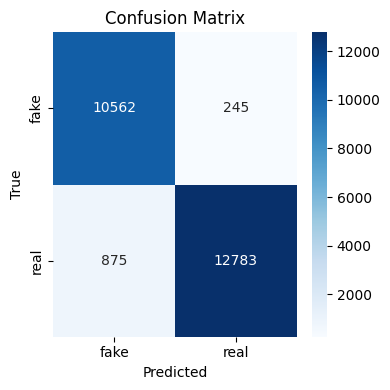

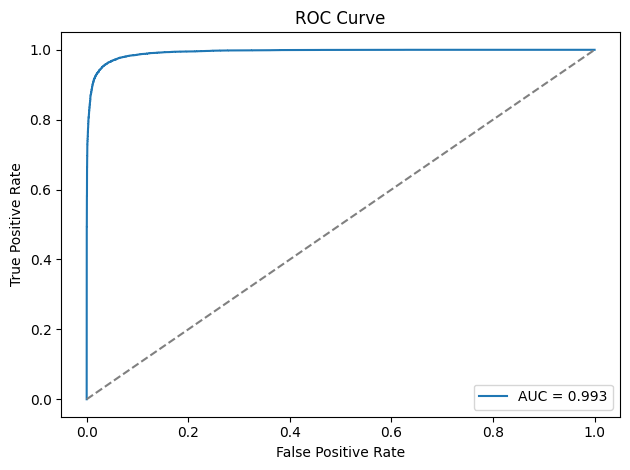

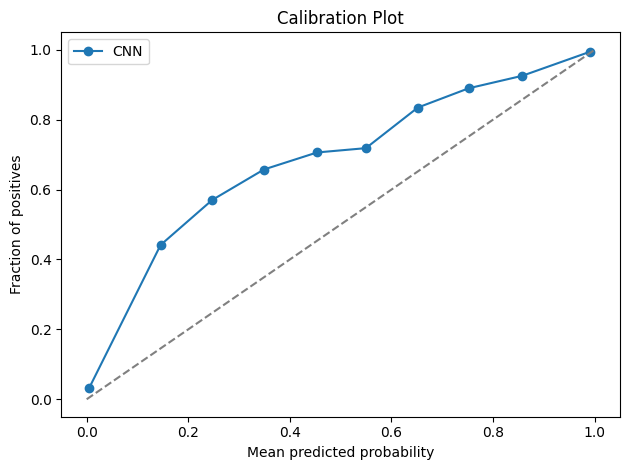

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from CNN_opt import CNN
from torchvision import datasets
from torch.utils.data import DataLoader
from sklearn.metrics import (
    accuracy_score, roc_auc_score, average_precision_score,
    roc_curve, confusion_matrix
)
from sklearn.calibration import calibration_curve
import seaborn as sns

# ─── 1) LOAD MODEL ─────────────────────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN().to(device)
model.load_state_dict(torch.load("best_cnn_opt.pth", map_location=device))
model.eval()

# ─── 2) PREPARE TEST DATA ──────────────────────────────────────────────────────
# assumes folder structure:
# ./FF++/test/real/*.jpg
# ./FF++/test/fake/*.jpg
TEST_DIR = "./FF++/test"
BATCH_SIZE = 32

mean = (0.5,0.5,0.5)
std = mean
val_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

test_ds = datasets.ImageFolder(TEST_DIR, transform=val_transform)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# ─── 3) INFERENCE ON TEST SET ──────────────────────────────────────────────────
y_true = []
y_probs = []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(device)
        logits = model(imgs)
        probs = torch.softmax(logits, dim=1)[:,1].cpu().numpy()  # P(fake)
        y_probs.extend(probs)
        y_true.extend(labels.numpy())

y_true = np.array(y_true)
y_probs = np.array(y_probs)
# if your classes are reversed, invert the predicted scores:
y_probs = 1.0 - y_probs
y_pred  = (y_probs > 0.5).astype(int)

# ─── 4) COMPUTE METRICS ────────────────────────────────────────────────────────
acc = accuracy_score(y_true, y_pred)
auc = roc_auc_score(y_true, y_probs)
ap  = average_precision_score(y_true, y_probs)

# Equal-Error Rate (EER): point where FPR == FNR
fpr, tpr, thr = roc_curve(y_true, y_probs)
fnr = 1 - tpr
eer_idx = np.nanargmin(np.abs(fnr - fpr))
eer = fpr[eer_idx]

print(f"Accuracy:       {acc*100:5.2f}%")
print(f"AUC-ROC:        {auc:.4f}")
print(f"Avg Precision: {ap:.4f}")
print(f"EER:            {eer:.4f} @ threshold {thr[eer_idx]:.4f}")

# ─── 5) PLOT CONFUSION MATRIX ─────────────────────────────────────────────────
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(4,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_ds.classes,
            yticklabels=test_ds.classes)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

# ─── 6) PLOT ROC CURVE ─────────────────────────────────────────────────────────
plt.figure()
plt.plot(fpr, tpr, label=f"AUC = {auc:.3f}")
plt.plot([0,1],[0,1], '--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

# ─── 7) PLOT CALIBRATION (RELIABILITY) DIAGRAM ────────────────────────────────
prob_true, prob_pred = calibration_curve(y_true, y_probs, n_bins=10)
plt.figure()
plt.plot(prob_pred, prob_true, 'o-', label="CNN")
plt.plot([0,1],[0,1],'--', color='gray')
plt.xlabel("Mean predicted probability")
plt.ylabel("Fraction of positives")
plt.title("Calibration Plot")
plt.legend()
plt.tight_layout()
plt.show()


### Model Evaluation Metrics

To assess the performance of our CNN-based deepfake detector, we evaluated it on the **unseen test split** using a combination of classification and calibration metrics.



#### Confusion Matrix

The confusion matrix shows strong predictive performance on both classes:

- **True Positives (Real correctly classified):** 12,783  
- **True Negatives (Fake correctly classified):** 10,562  
- **False Positives:** 245  
- **False Negatives:** 875  

This indicates the model is highly effective at distinguishing real from fake faces, with a relatively low number of misclassifications.



#### ROC Curve & AUC

The ROC curve illustrates the **true positive rate vs. false positive rate** at different classification thresholds.  
Our model achieves an **AUC (Area Under Curve)** score of **0.993**, which confirms that it is **highly discriminative**, even under varying threshold settings.


#### Calibration Plot

The calibration plot compares the predicted probabilities against the actual fraction of positive samples.

- The curve is close to the ideal diagonal, especially at high confidence levels.
- This indicates that the model's **probability estimates are well-calibrated**, meaning its outputs can be interpreted as reliable confidence scores.

Overall, these metrics demonstrate that our model is not only **accurate**, but also **well-calibrated** — a critical property for high-stakes applications like deepfake detection.


## **Which Features Does Our Model Use to Classify Real vs. Fake Faces?**

By visualizing the learned filters and activation maps, we can gain insight into the internal workings of our CNN.

Interestingly, the model appears to have developed **specialized filters** that focus on distinct facial regions:

- **Early convolutional layers** capture low-level features such as **edges and textures**, helping differentiate **facial regions from the background**, and identifying elements like **eyebrows, eyes, and the hairline**.
- **Deeper layers** shift focus toward **higher-level, face-agnostic features** such as the **mouth**, **nose**, and even **dimples or asymmetries**, which may contain subtle artifacts introduced during synthesis.
- In the **final fully connected layer**, we observe a clear distinction: the **left neuron responds to real faces**, while the **right neuron activates for fake ones**.

These visualizations confirm that the model not only learns spatial patterns, but also implicitly develops a hierarchy of features that align with both visual semantics and manipulation traces.


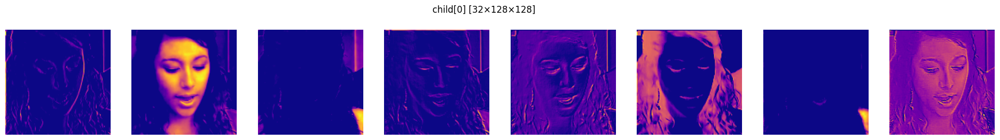

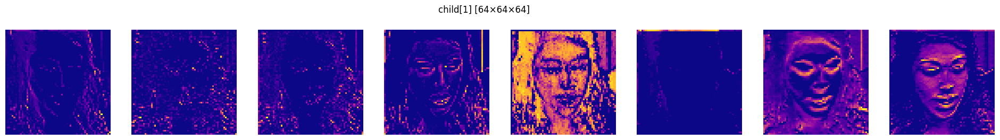

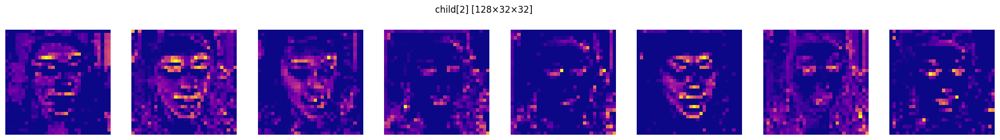

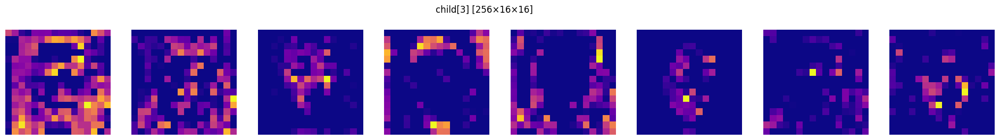

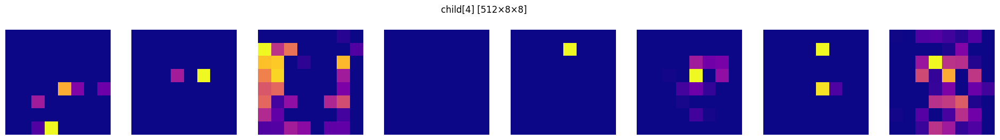

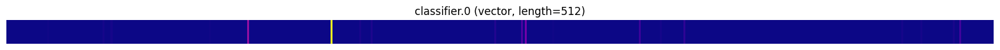

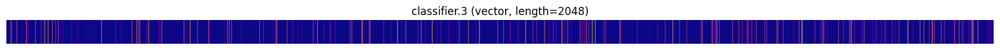

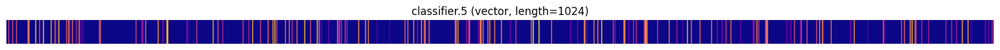

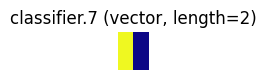

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from PIL import Image
from typing import List, Union
from CNN_opt import CNN
import os


def visualize_activations(
    model: torch.nn.Module,
    input_tensor: torch.Tensor,
    layers_to_hook: List[Union[int,str]],
    max_maps: int = 8,
    cmap: str = "viridis",
    class_names: List[str] = None
):
    """
    Hooks the given layers, does one forward pass, then plots:
     - 3D activations [C,H,W] as a grid of small images (up to max_maps).
     - 1D activations [C] as a single-row image (Cx1), with optional x-tick labels if class_names is provided.
    """
    activations = {}

    def make_hook(name):
        def hook(_mod, _inp, out):
            # grab only the first batch
            t = out.detach().cpu()[0]
            activations[name] = t
        return hook

    # find submodules to hook
    children = list(model.children())
    named = dict(model.named_modules())
    handles = []
    for li in layers_to_hook:
        if isinstance(li, int):
            if li<0 or li>=len(children):
                raise IndexError(f"bad child index {li}")
            subm = children[li]
            name = f"child[{li}]"
        else:
            if li not in named:
                raise KeyError(f"no module named '{li}'")
            subm = named[li]
            name = li
        handles.append(subm.register_forward_hook(make_hook(name)))

    # forward
    model.eval()
    with torch.no_grad():
        _ = model(input_tensor)

    # remove hooks
    for h in handles:
        h.remove()

    # now plot
    for name, feat in activations.items():
        if feat.ndim == 3:
            # convolutional maps
            C,H,W = feat.shape
            n = min(C, max_maps)
            fig, axes = plt.subplots(1,n,figsize=(3*n,3))
            fig.suptitle(f"{name} [{C}×{H}×{W}]")
            for i in range(n):
                axes[i].imshow(feat[i], cmap=cmap)
                axes[i].axis("off")
            plt.show()

        elif feat.ndim == 1:
            # dense layer: show as a stripe
            C = feat.shape[0]
            stripe = feat.unsqueeze(0).numpy()  # shape (1,C)
            fig, ax = plt.subplots(figsize=(min(C/5,20),0.5))
            ax.imshow(stripe, aspect='auto', cmap=cmap)
            ax.set_title(f"{name} (vector, length={C})")
            ax.axis("off")

            # if this is final 2‐unit layer, label axes
            if C==2 and class_names:
                ax.set_xticks([0,1])
                ax.set_xticklabels(class_names)
                ax.set_yticks([])
            plt.show()

        else:
            print(f"[{name}] skipping unsupported shape {tuple(feat.shape)}")



if __name__=="__main__":
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = CNN().to(DEVICE)
    model.load_state_dict(torch.load("./best_cnn_opt.pth", map_location=DEVICE))
    model.eval()
    device = next(model.parameters()).device

    # 2) load + preprocess a single image
    TRAIN_DATA_ROOT = "./FF++"
    CLASS = random.choice(["real","fake"])
    COMPLETE_PATH = os.path.join(TRAIN_DATA_ROOT,CLASS)
    img_path = os.path.join(
    COMPLETE_PATH,
    random.choice(os.listdir(COMPLETE_PATH))
)
    img = Image.open(img_path).convert("RGB")
    inp = val_transform(img).unsqueeze(0).to(DEVICE)

    # 3) pick layers to inspect:
    hooks = [
        0,                # first top‐level block
        1,
        2,                # say your 3rd block
        3,
        4,
        "classifier.0",   # that Flatten()
        "classifier.3",   # next Linear → 1024
        "classifier.5",    # final Linear → 2
        "classifier.7"
    ]

    # 4) call it, passing your two class names:
    visualize_activations(
        model,
        inp,
        layers_to_hook=hooks,
        max_maps=8,
        cmap="plasma",
        class_names=["Real","Fake"]
    )


### Feature Map Visualization Across Network Depth

To better understand what our model is learning, we visualize activation maps at various depths of the convolutional neural network. Each row corresponds to a different layer (or block) in the architecture, illustrating how the representation of the input image evolves through the network.



#### - Layer: child[0] – Shape [32×128×128]
This is the first convolutional block, where low-level features like **edges**, **contours**, and **color transitions** are extracted. Some filters clearly focus on **hairline**, **jawline**, and **eye regions**, showing strong boundary detection.

#### - Layer: child[1] – Shape [64×64×64]
In this stage, the model begins to detect **higher-order textures** and **contrast patterns**, still maintaining spatial detail. Activations appear around the **eyes**, **mouth**, and **nose**, reflecting a shift toward **semantically meaningful regions**.

#### - Layer: child[2] – Shape [128×32×32]
The receptive field is larger here, and the features become more abstract. Some filters focus on **facial symmetry**, **lighting consistency**, and **region blending**, which are known to expose deepfake artifacts.

#### - Layer: child[3] – Shape [256×16×16]
This layer captures **high-level concepts** in a compressed spatial resolution. Activations become more sparse and selective, indicating that the model is focusing on **key structural traits** rather than raw textures.

#### - Layer: child[4] – Shape [512×8×8]
Here, the representations are **highly abstract**, often acting as detectors for very specific patterns or manipulations. Only a few filters show strong activations, which may correspond to **deepfake-specific cues** learned during training.

#### - Fully Connected Layers: classifier.0, classifier.3, classifier.5
These plots represent the **activation intensity** of neurons in the final classification layers:

- classifier.0 (512 units): Aggregates compact features.
- classifier.3 (2048 units): High-dimensional embedding of all learned features.
- classifier.5 (1024 units): Final dense layer before the prediction.

The **sparse and peaked activations** suggest that the model has identified **distinct neural pathways** for detecting real vs. fake images.


These visualizations confirm that the model has learned a **hierarchical and semantically rich representation** of facial features, progressing from generic edges to deepfake-specific patterns.


## **Interpreting Model Focus: Real vs. Swapped Face Classification**


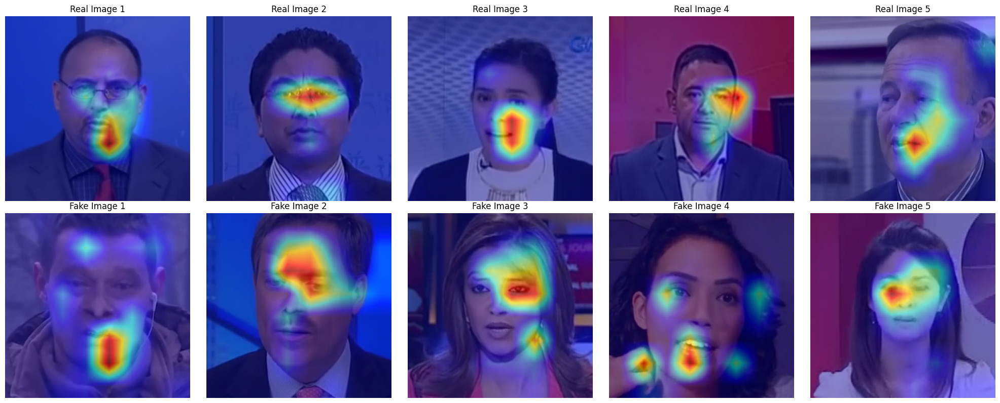

In [48]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
%matplotlib inline


# Load model
model = CNN()
model.load_state_dict(torch.load("best_cnn_opt.pth", map_location=torch.device("cpu")))
model.eval()

# Set target layer (modify this to match your actual model)
target_layer = model.layer4  # Adjust this line


# Prepare Grad-CAM
cam = GradCAM(model=model, target_layers=[target_layer])

# Select 5 random real and 5 random fake images
real_imgs = random.sample(os.listdir(REAL_DIR), 5)
fake_imgs = random.sample(os.listdir(FAKE_DIR), 5)
all_imgs = [(os.path.join(REAL_DIR, f), "Real") for f in real_imgs] + \
           [(os.path.join(FAKE_DIR, f), "Fake") for f in fake_imgs]

# Plotting
fig, axs = plt.subplots(2, 5, figsize=(20, 8))
axs = axs.flatten()

for i, (img_path, label) in enumerate(all_imgs):
    img = Image.open(img_path).convert("RGB")
    input_tensor = val_transform(img).unsqueeze(0)
    rgb_img = np.array(img.resize((256, 256))) / 255.0

    # Compute Grad-CAM
    grayscale_cam = cam(input_tensor=input_tensor, targets=None)[0]
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    # Display in subplot
    axs[i].imshow(visualization)
    axs[i].set_title(f"{label} Image {i%5 + 1}")
    axs[i].axis("off")

plt.tight_layout()
plt.savefig("CAMs.png")
plt.show()



The heatmaps reveal that our CNN has learned to focus on regions commonly associated with **deepfake artifacts**, particularly around the **lips/chin** and **eye areas**. These regions were historically prone to visual inconsistencies, especially in early face-swapping models where **lip-syncing techniques were primitive**, often resulting in **misaligned or flickering features** between the source and target faces.

Back then, such artifacts were clear indicators of tampering and could be reliably picked up by convolutional models. However, as deepfake generation methods have evolved — especially with the rise of **GANs and spatio-temporal coherence models** — these visual flaws have become significantly more subtle or entirely absent.

As a result, modern CNN-based detectors now face a more challenging task, requiring them to look for **invisible or frequency-based inconsistencies**, rather than relying solely on obvious geometric misalignments.

## **Fine-Tuning a Pretrained EfficientNet-B3**

EfficientNet represented a major breakthrough in image classification when it was first introduced, thanks to its novel **compound scaling method**. This approach allowed the model to scale depth, width, and resolution in a balanced way, resulting in **faster training** and **competitive accuracy** compared to much larger and heavier architectures.

Having achieved strong performance on **ImageNet benchmarks**, EfficientNet has since been adopted as a **feature extraction backbone** in various computer vision tasks — including deepfake detection, particularly in **spatially focused models**.

In this section, we will load an **EfficientNet-B3** model pretrained on ImageNet, **remove its original classification head**, and **fine-tune it on our deepfake detection dataset** to adapt it to our binary classification task (real vs. fake).


In [2]:
import os
import signal
import glob
import re
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import timm
from tqdm import tqdm

# ─── CONFIG ─────────────────────────────────────────────────────────────────────
DATA_ROOT     = "FF++"
IMG_SIZE      = 224
BATCH_SIZE    = 8
SEED          = 42
FT_EPOCHS     = 5
LEARNING_RATE = 1e-4
DEVICE        = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
CKPT_LATEST   = "EffNetB0_latest.pth"
CKPT_PATTERN  = "EffNetB0_epoch{epoch:02d}.pth"
initial_epoch = 0
# ────────────────────────────────────────────────────────────────────────────────

# ─── GRACEFUL STOP & CHECKPOINT ─────────────────────────────────────────────────
stop_training = False

def sigint_handler(signum, frame):
    global stop_training
    print("\n⚡ SIGINT caught — saving checkpoint immediately and exiting...")
    stop_training = True
    # Save immediate checkpoint
    ckpt = {
        'epoch': current_epoch,
        'model_state': model.state_dict(),
        'opt_state': optimizer.state_dict()
    }
    torch.save(ckpt, CKPT_LATEST)
    print(f"💾 Immediate checkpoint saved to {CKPT_LATEST}")
    sys.exit(0)

signal.signal(signal.SIGINT, sigint_handler)
# ────────────────────────────────────────────────────────────────────────────────

# ─── FIND LAST CHECKPOINT ───────────────────────────────────────────────────────
def find_last_checkpoint():
    if os.path.isfile(CKPT_LATEST):
        return CKPT_LATEST
    files = glob.glob("EffNetB0_epoch*.pth")
    pattern = re.compile(r"epoch(\d+)\.pth$")
    epochs = [(int(pattern.search(f).group(1)), f)
              for f in files if pattern.search(f)]
    return max(epochs)[1] if epochs else None
# ────────────────────────────────────────────────────────────────────────────────

# ─── DATALOADERS ───────────────────────────────────────────────────────────────
transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485, 0.456, 0.406),
                         std=(0.229, 0.224, 0.225))
])

dirs = {x: os.path.join(DATA_ROOT, x) for x in ['train', 'val', 'test']}

datasets_dict = {x: datasets.ImageFolder(dirs[x], transform=transform)
                 for x in dirs}

dataloaders = {x: DataLoader(datasets_dict[x], batch_size=BATCH_SIZE,
                             shuffle=(x=='train'), num_workers=4)
               for x in dirs}

dataset_sizes = {x: len(datasets_dict[x]) for x in dirs}
classes = datasets_dict['train'].classes
# ────────────────────────────────────────────────────────────────────────────────

# ─── MODEL ───────────────────────────────────────────────────────────────────────
model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=0)
# freeze backbone
for param in model.parameters():
    param.requires_grad = False

# classifier head
head = nn.Sequential(
    nn.Linear(model.num_features, 1024),
    nn.ReLU(),
    nn.BatchNorm1d(1024),
    nn.Dropout(0.5),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.BatchNorm1d(256),
    nn.Dropout(0.5),
    nn.Linear(256, 1),
    nn.Sigmoid()
)
model = nn.Sequential(model, head).to(DEVICE)
# ────────────────────────────────────────────────────────────────────────────────

# ─── CRITERION & OPTIMIZER ───────────────────────────────────────────────────────
criterion = nn.BCELoss()
optimizer = optim.Adam(head.parameters(), lr=LEARNING_RATE)
# ────────────────────────────────────────────────────────────────────────────────

# ─── LOAD CHECKPOINT ─────────────────────────────────────────────────────────────
last_ckpt = find_last_checkpoint()
if last_ckpt:
    resp = input(f"⚠️ Found checkpoint '{last_ckpt}'. Resume? [y/N]: ")
    if resp.strip().lower().startswith('y'):
        print(f"→ Loading from {last_ckpt}")
        ckpt = torch.load(last_ckpt, map_location=DEVICE)
        model.load_state_dict(ckpt['model_state'])
        optimizer.load_state_dict(ckpt['opt_state'])
        initial_epoch = ckpt['epoch'] + 1
    else:
        print("→ Starting from scratch.")
else:
    print("→ No checkpoint found; training head from scratch.")
# ────────────────────────────────────────────────────────────────────────────────

# ─── TRAIN & VALIDATE ───────────────────────────────────────────────────────────
def train_one_epoch(epoch):
    global current_epoch
    current_epoch = epoch
    model.train()
    running_loss = 0.0
    running_corrects = 0
    loop = tqdm(dataloaders['train'], desc=f"Epoch {epoch} [Train]", leave=False)
    for inputs, labels in loop:
        inputs, labels = inputs.to(DEVICE), labels.float().unsqueeze(1).to(DEVICE)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
        preds = (outputs > 0.5).float()
        running_corrects += torch.sum(preds == labels)
        loop.set_postfix(loss=loss.item())
    epoch_loss = running_loss / dataset_sizes['train']
    epoch_acc = running_corrects.double() / dataset_sizes['train']
    print(f"Epoch {epoch} Train Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")


def validate(epoch):
    model.eval()
    running_loss = 0.0
    running_corrects = 0
    loop = tqdm(dataloaders['val'], desc=f"Epoch {epoch} [Val]", leave=False)
    with torch.no_grad():
        for inputs, labels in loop:
            inputs, labels = inputs.to(DEVICE), labels.float().unsqueeze(1).to(DEVICE)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            preds = (outputs > 0.5).float()
            running_corrects += torch.sum(preds == labels)
            loop.set_postfix(loss=loss.item())
    epoch_loss = running_loss / dataset_sizes['val']
    epoch_acc = running_corrects.double() / dataset_sizes['val']
    print(f"Epoch {epoch} Val   Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")
    return epoch_acc

best_acc = 0.0
import sys
for epoch in range(initial_epoch, FT_EPOCHS):
    train_one_epoch(epoch)
    # Skip validation if SIGINT triggered inside training
    if stop_training:
        break
    val_acc = validate(epoch)
    # save checkpoint
    ckpt_path = CKPT_PATTERN.format(epoch=epoch)
    torch.save({
        'epoch': epoch,
        'model_state': model.state_dict(),
        'opt_state': optimizer.state_dict()
    }, ckpt_path)
    torch.save({
        'epoch': epoch,
        'model_state': model.state_dict(),
        'opt_state': optimizer.state_dict()
    }, CKPT_LATEST)
    print(f"💾 Saved checkpoint {ckpt_path}")

    if val_acc > best_acc:
        best_acc = val_acc
    if stop_training:
        print("Stopping early.")
        break

# ─── TEST & ROC ─────────────────────────────────────────────────────────────────
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

y_true, y_prob = [], []
model.eval()
with torch.no_grad():
    loop = tqdm(dataloaders['test'], desc="Test", leave=False)
    for inputs, labels in loop:
        inputs = inputs.to(DEVICE)
        outputs = model(inputs).cpu().numpy().flatten()
        y_prob.extend(outputs.tolist())
        y_true.extend(labels.numpy().tolist())

fpr, tpr, _ = roc_curve(y_true, y_prob)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label=f"AUC={roc_auc:.2f}")
plt.plot([0,1], [0,1], 'k--')
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("Test ROC Curve")
plt.legend()
plt.show()

→ No checkpoint found; training head from scratch.


Epoch 0 Train Loss: 0.5483 Acc: 0.7209


Epoch 0 Val   Loss: 0.5741 Acc: 0.7315
💾 Saved checkpoint EffNetB0_epoch00.pth


Epoch 1 Train Loss: 0.4763 Acc: 0.7746


Epoch 1 Val   Loss: 0.6554 Acc: 0.7403
💾 Saved checkpoint EffNetB0_epoch01.pth


Epoch 2 [Train]:  35%|███▍      | 5727/16559 [31:22<1:11:11,  2.54it/s, loss=0.361]


⚡ SIGINT caught — saving checkpoint immediately and exiting...
⚡ SIGINT caught — saving checkpoint immediately and exiting...

⚡ SIGINT caught — saving checkpoint immediately and exiting...


⚡ SIGINT caught — saving checkpoint immediately and exiting...

⚡ SIGINT caught — saving checkpoint immediately and exiting...
💾 Immediate checkpoint saved to EffNetB0_latest.pth
💾 Immediate checkpoint saved to EffNetB0_latest.pth
💾 Immediate checkpoint saved to EffNetB0_latest.pth💾 Immediate checkpoint saved to EffNetB0_latest.pth



💾 Immediate checkpoint saved to EffNetB0_latest.pth


SystemExit: 0

/home/jpcha/TFM/venv/lib/python3.12/site-packages/IPython/core/interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


## **Deepfake Generation**

Learning to detect deepfake media is only one side of the coin. In fact, many state-of-the-art detection models are trained and validated on **custom datasets** generated by the research teams themselves. To enable this, one must also understand **how to generate synthetic samples** effectively.

In this section, we train our own **GAN (Generative Adversarial Network)** architecture using all the **real face samples** from the FaceForensics++ dataset utilized so far. Our goal is to **synthesize face images from random noise**, and compare the results qualitatively with leading generative models such as **StyleGAN3** and **SORA**.

To reduce computational overhead and training time, we restrict our GAN to generate images at a resolution of **64×64 pixels**.

Note: The GAN used here does **not perform face swapping**. Instead, it learns to generate entire face images from scratch.  
For actual face-swapping, a different approach is required — typically involving **two autoencoder-decoder networks**, each trained on a specific identity, with their encoder-decoder pairs later **cross-linked** to perform the swap.


## **DCGAN from scratch**

In [18]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, utils
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid
from PIL import Image
from tqdm import tqdm
import glob

# ----------------------------
# 1) HYPERPARAMETERS
# ----------------------------
FFPP_ROOT = "/home/jpcha/TFM/ADNE/FF++"
BATCH_SIZE    = 64
IMAGE_SIZE    = 64     # we'll resize/crop to 64×64
NC            = 3       # number of channels (RGB)
NZ            = 100     # latent vector size
NGF           = 64      # generator feature map size
NDF           = 64      # discriminator feature map size
NUM_EPOCHS    = 50
LR            = 2e-4
BETA1         = 0.5     # Adam beta1
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----------------------------
# 2) DATASET & DATALOADER
# ----------------------------

splits   = ["train", "val", "test"]
real_dirs = [os.path.join(FFPP_ROOT, split, "real") for split in splits]

all_real_paths = []
for d in real_dirs:
    all_real_paths += glob.glob(os.path.join(d, "*.jpg"))
print(f"Found {len(all_real_paths)} real images across {splits}")

# --- 3) A TINY CUSTOM DATASET FOR JUST REAL IMAGES ---
class RealFaceDataset(Dataset):
    def __init__(self, paths, transform=None):
        self.paths = paths
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        # we ignore labels here (GAN only needs real samples)
        return img

# --- 4) TRANSFORMS & DATALOADER ---

transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])

dataset = RealFaceDataset(all_real_paths, transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=4, pin_memory=True)

# now `dataloader` yields *only* real face batches from train+val+test


# ----------------------------
# 3) MODEL DEFINITIONS
# ----------------------------
# weight init
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator: FC → transpose-conv
# ----------------------------
# 3) MODEL DEFINITIONS
# ----------------------------
# weight init stays the same

# Generator: FC → transpose-conv to 64×64
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            # input Z:           NZ × 1 × 1
            nn.ConvTranspose2d(NZ, NGF*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(NGF*8),
            nn.ReLU(True),
            # state: (NGF*8) x 4 x 4

            nn.ConvTranspose2d(NGF*8, NGF*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(NGF*4),
            nn.ReLU(True),
            # state: (NGF*4) x 8 x 8

            nn.ConvTranspose2d(NGF*4, NGF*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(NGF*2),
            nn.ReLU(True),
            # state: (NGF*2) x 16 x 16

            nn.ConvTranspose2d(NGF*2, NGF,   4, 2, 1, bias=False),
            nn.BatchNorm2d(NGF),
            nn.ReLU(True),
            # state: (NGF) x 32 x 32

            nn.ConvTranspose2d(NGF,   NC,    4, 2, 1, bias=False),
            nn.Tanh()
            # output: NC x 64 x 64
        )

    def forward(self, input):
        return self.main(input)




class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            # input: NC x 256 x 256
            nn.Conv2d(NC, NDF,    4, 2, 1, bias=False),  # → NDF x 128 x 128
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(NDF, NDF*2, 4, 2, 1, bias=False),  # → NDF*2 x 64 x 64
            nn.BatchNorm2d(NDF*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(NDF*2, NDF*4, 4, 2, 1, bias=False),# → NDF*4 x 32 x 32
            nn.BatchNorm2d(NDF*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(NDF*4, NDF*8, 4, 2, 1, bias=False),# → NDF*8 x 16 x 16
            nn.BatchNorm2d(NDF*8),
            nn.LeakyReLU(0.2, inplace=True),

            # final conv: keep the spatial feature-map, we’ll pool over it
            nn.Conv2d(NDF*8, 1, 4, 1, 0, bias=False),    # → 1 x 13 x 13  (for 256×256 in)
            # no sigmoid here
        )
        # global avg pool to 1×1, then flatten
        self.pool = nn.AdaptiveAvgPool2d((1,1))

    def forward(self, x):
        x = self.features(x)            # [B,1,H,W]
        x = self.pool(x)                # [B,1,1,1]
        x = x.reshape(x.size(0))        # [B]
        return torch.sigmoid(x)         # probabilities


# instantiate
netG = Generator().to(DEVICE)
netG.apply(weights_init)
netD = Discriminator().to(DEVICE)
netD.apply(weights_init)

# ----------------------------
# 4) LOSS & OPTIMIZERS
# ----------------------------
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, NZ, 1, 1, device=DEVICE)

real_label, fake_label = 1., 0.

optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(BETA1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(BETA1, 0.999))

# ----------------------------
# 5) TRAINING LOOP
# ----------------------------
writer = SummaryWriter(log_dir="runs/basic_dcgan")
best_errG = float('inf')

for epoch in range(1, NUM_EPOCHS+1):
    # create a progress bar for this epoch
    epoch_pbar = tqdm(
        enumerate(dataloader, 0),
        total=len(dataloader),
        desc=f"Epoch {epoch}/{NUM_EPOCHS}",
        unit="batch"
    )

    for i, real_batch in epoch_pbar:
        # (1) Update D on real
        netD.zero_grad()
        real_cpu = real_batch.to(DEVICE)
        b_size = real_cpu.size(0)
        label_real = torch.full((b_size,), real_label, device=DEVICE)
        output_real = netD(real_cpu)
        errD_real = criterion(output_real, label_real)
        errD_real.backward()

        # (2) Update D on fake
        noise = torch.randn(b_size, NZ, 1, 1, device=DEVICE)
        fake = netG(noise)
        label_fake = torch.full((b_size,), fake_label, device=DEVICE)
        output_fake = netD(fake.detach())
        errD_fake = criterion(output_fake, label_fake)
        errD_fake.backward()
        optimizerD.step()

        # (3) Update G
        netG.zero_grad()
        label_G = torch.full((b_size,), real_label, device=DEVICE)
        output_for_G = netD(fake)
        errG = criterion(output_for_G, label_G)
        errG.backward()
        optimizerG.step()

        # Logging every 100 batches
        if i % 100 == 0:
            lossD = (errD_real + errD_fake).item()
            lossG = errG.item()
            step = (epoch - 1) * len(dataloader) + i

            # write scalars to TensorBoard
            writer.add_scalar("Loss/Discriminator", lossD, step)
            writer.add_scalar("Loss/Generator", lossG, step)
            writer.add_scalar("D(x)", output_real.mean().item(), step)
            writer.add_scalar("D(G)", output_fake.mean().item(), step)

        # update tqdm postfix every batch
        epoch_pbar.set_postfix({
            "Loss_D": f"{(errD_real+errD_fake).item():.4f}",
            "Loss_G": f"{errG.item():.4f}"
        })

    epoch_pbar.close()

    # (4) After each epoch, log a grid of generated images
    with torch.no_grad():
        fake_samples = netG(fixed_noise).detach().cpu()
    grid = make_grid(fake_samples, nrow=8, normalize=True, value_range=(-1,1))
    writer.add_image("Generated Images", grid, epoch)

    # (5) Checkpoint best generator by generator loss
    if lossG < best_errG:
        best_errG = lossG
        torch.save(netG.state_dict(), "netG_best.pth")
        torch.save(netD.state_dict(), "netD_best.pth")
        print(f"  ✓ New best generator (Loss_G={lossG:.4f}) — checkpoint saved")

# close the writer when done
writer.close()

print("Training complete!")


Found 102165 real images across ['train', 'val', 'test']


Epoch 1/50: 100%|██████████| 1597/1597 [44:32<00:00,  1.67s/batch, Loss_D=1.4119, Loss_G=1.3756] 


  ✓ New best generator (Loss_G=4.6559) — checkpoint saved


Epoch 2/50: 100%|██████████| 1597/1597 [45:08<00:00,  1.70s/batch, Loss_D=0.3325, Loss_G=2.7857] 


  ✓ New best generator (Loss_G=3.7327) — checkpoint saved


Epoch 4/50: 100%|██████████| 1597/1597 [42:11<00:00,  1.58s/batch, Loss_D=0.2371, Loss_G=3.2181] 


  ✓ New best generator (Loss_G=2.2231) — checkpoint saved


Epoch 17/50:   0%|          | 0/1597 [00:00<?, ?batch/s]


KeyboardInterrupt: 

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=./runs/basic_dcgan --port 6006 --host 0.0.0.0

<div align="center">
  <img src="./Images/dcgan_losses_first_15_epochs.png" width="600"/><br>
  <em>Generator vs Discriminator Loss (First 15 Epochs)</em>
</div>

<br>

<div align="center">
  <img src="./Images/generated_results.gif" width="600"/><br>
  <em>Generated Face Samples Over Epochs</em>
</div>


### Generator and Discriminator Dynamics

The training curves clearly illustrate the core principle behind **Generative Adversarial Networks (GANs)**: as the **discriminator** becomes more effective at distinguishing real from fake samples, the **generator's loss increases** accordingly. This adversarial process drives both networks to improve over time.

As long as the discriminator maintains an edge over the generator, the overall quality of the generated samples continues to improve — up to a point of equilibrium or saturation.



### Early Epoch Sample Analysis

Above, we show an **8×8 grid** of face samples generated at **64×64 resolution** during the first 9 epochs. While the generator has already learned the **general structure and layout** of a human face, the outputs lack critical details, resulting in images that appear **unnatural or uncanny**.



### Improving Generation Quality

There are various strategies to enhance generation quality — such as **progressive growing**, **attention mechanisms**, or **loss function tuning** — but these often introduce **significant computational overhead**.

One key insight is that **high-performing GANs require strong discriminators**. The discriminator must be sufficiently capable to **challenge the generator**, forcing it to produce increasingly realistic outputs. If the discriminator is too weak or easily fooled, the generator quickly converges to **mediocre solutions**.

For this reason, it is common practice to **pretrain the discriminator** on real data or auxiliary tasks before beginning adversarial training. This gives the GAN a more stable and effective starting point.


In [ ]:
import os
import glob
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid
from PIL import Image
from tqdm import tqdm

# ----------------------------
# 1) HYPERPARAMETERS
# ----------------------------
FFPP_ROOT    = "./ADNE/FF++"
BATCH_SIZE   = 64
IMAGE_SIZE   = 64
NC           = 3
NZ           = 100
NGF          = 64
NDF          = 64
NUM_EPOCHS   = 50
LR_G         = 2e-4
LR_D         = 2e-4
BETA1        = 0.5
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LAMBDA_GP    = 10.0

# checkpoint paths
CKPT_LAST    = "checkpoint_last.pth"
CKPT_BEST    = "netG_wgan_gp_best.pth"

# ----------------------------
# 2) DATASET & DATALOADER
# ----------------------------
class RealFaceDataset(Dataset):
    def __init__(self, paths, transform=None):
        self.paths = paths
        self.transform = transform
    def __len__(self):
        return len(self.paths)
    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        return self.transform(img)

# gather all real images
real_paths = []
for split in ("train","val","test"):
    real_paths += glob.glob(os.path.join(FFPP_ROOT, split, "real", "*.jpg"))
print(f"Found {len(real_paths)} real images")

transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])
dataloader = DataLoader(
    RealFaceDataset(real_paths, transform),
    batch_size=BATCH_SIZE, shuffle=True,
    num_workers=4, pin_memory=True
)

# ----------------------------
# 3) MODELS
# ----------------------------
def weights_init(m):
    cls = m.__class__.__name__
    if "Conv" in cls:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif "BatchNorm" in cls:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(NZ, NGF*8, 4,1,0,bias=False),
            nn.BatchNorm2d(NGF*8), nn.ReLU(True),
            nn.ConvTranspose2d(NGF*8,NGF*4,4,2,1,bias=False),
            nn.BatchNorm2d(NGF*4), nn.ReLU(True),
            nn.ConvTranspose2d(NGF*4,NGF*2,4,2,1,bias=False),
            nn.BatchNorm2d(NGF*2), nn.ReLU(True),
            nn.ConvTranspose2d(NGF*2,NGF,  4,2,1,bias=False),
            nn.BatchNorm2d(NGF),   nn.ReLU(True),
            nn.ConvTranspose2d(NGF,  NC,   4,2,1,bias=False),
            nn.Tanh()
        )
    def forward(self, z):
        return self.main(z)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(NC, NDF,   4,2,1,bias=False), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(NDF, NDF*2,4,2,1,bias=False), nn.BatchNorm2d(NDF*2), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(NDF*2,NDF*4,4,2,1,bias=False), nn.BatchNorm2d(NDF*4), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(NDF*4,NDF*8,4,2,1,bias=False), nn.BatchNorm2d(NDF*8), nn.LeakyReLU(0.2, inplace=True),
        )
        self.final = nn.Conv2d(NDF*8, 1, 4,1,0,bias=False)

    def forward(self, x):
        h = self.features(x)
        return self.final(h).view(-1)

netG = Generator().to(DEVICE); netG.apply(weights_init)
netD = Discriminator().to(DEVICE); netD.apply(weights_init)

# ----------------------------
# 4) WGAN-GP LOSS & OPTIMIZERS
# ----------------------------
optimG = optim.Adam(netG.parameters(), lr=LR_G, betas=(BETA1,0.999))
optimD = optim.Adam(netD.parameters(), lr=LR_D, betas=(BETA1,0.999))
fixed_noise = torch.randn(64, NZ,1,1, device=DEVICE)

def gradient_penalty(D, real, fake, device):
    bsz = real.size(0)
    alpha = torch.rand(bsz,1,1,1,device=device)
    x_hat = (alpha*real + (1-alpha)*fake).requires_grad_(True)
    d_hat = D(x_hat)
    grads = torch.autograd.grad(
        outputs=d_hat, inputs=x_hat,
        grad_outputs=torch.ones_like(d_hat),
        create_graph=True
    )[0].view(bsz, -1)
    return LAMBDA_GP*((grads.norm(2,dim=1)-1)**2).mean()

# ----------------------------
# 5) RESUME LOGIC
# ----------------------------
start_epoch = 1
best_g_loss = float('inf')
if os.path.exists(CKPT_LAST):
    ans = input(f"Found checkpoint '{CKPT_LAST}'. Resume? [y/N]: ")
    if ans.lower().startswith('y'):
        ckpt = torch.load(CKPT_LAST, map_location=DEVICE)
        netG.load_state_dict(ckpt['netG'])
        netD.load_state_dict(ckpt['netD'])
        optimG.load_state_dict(ckpt['optG'])
        optimD.load_state_dict(ckpt['optD'])
        start_epoch = ckpt['epoch']
        best_g_loss  = ckpt.get('best_g_loss', best_g_loss)
        fixed_noise  = ckpt.get('fixed_noise', fixed_noise)
        print(f"→ Resuming from epoch {start_epoch}")

# ----------------------------
# 6) TRAINING LOOP
# ----------------------------
writer = SummaryWriter("runs/wgan_gp_dcgan")

try:
    for epoch in range(start_epoch, NUM_EPOCHS+1):
        pbar = tqdm(dataloader, desc=f"Epoch {epoch}/{NUM_EPOCHS}", unit="batch")
        for real in pbar:
            real = real.to(DEVICE)
            bsz  = real.size(0)

            # — D updates (5 steps) —
            for _ in range(5):
                z = torch.randn(bsz, NZ,1,1, device=DEVICE)
                fake = netG(z).detach()
                d_real = netD(real)
                d_fake = netD(fake)
                gp     = gradient_penalty(netD, real, fake, DEVICE)

                lossD = d_fake.mean() - d_real.mean() + gp
                optimD.zero_grad(); lossD.backward(); optimD.step()

            # — G update —
            z = torch.randn(bsz, NZ,1,1, device=DEVICE)
            fake = netG(z)
            lossG = -netD(fake).mean()
            optimG.zero_grad(); lossG.backward(); optimG.step()

            # logging
            step = (epoch-1)*len(dataloader) + pbar.n
            writer.add_scalar("Loss/D", lossD.item(), step)
            writer.add_scalar("Loss/G", lossG.item(), step)
            pbar.set_postfix(D=f"{lossD.item():.4f}", G=f"{lossG.item():.4f}")

        # sample & log images
        with torch.no_grad():
            samples = netG(fixed_noise).cpu()
        grid = make_grid(samples, nrow=8, normalize=True, value_range=(-1,1))
        writer.add_image("Generated", grid, epoch)

        # best‐G checkpoint
        if lossG.item() < best_g_loss:
            best_g_loss = lossG.item()
            torch.save({
                'netG': netG.state_dict(),
                'netD': netD.state_dict(),
                'optG': optimG.state_dict(),
                'optD': optimD.state_dict(),
                'epoch': epoch,
                'best_g_loss': best_g_loss,
                'fixed_noise': fixed_noise
            }, CKPT_BEST)
            print(f"  ✓ New best G (loss {best_g_loss:.4f})")

        # save “last” checkpoint each epoch
        torch.save({
            'netG': netG.state_dict(),
            'netD': netD.state_dict(),
            'optG': optimG.state_dict(),
            'optD': optimD.state_dict(),
            'epoch': epoch+1,
            'best_g_loss': best_g_loss,
            'fixed_noise': fixed_noise
        }, CKPT_LAST)

    print("Training complete")

except KeyboardInterrupt:
    # save final interrupt‐state
    torch.save({
        'netG': netG.state_dict(),
        'netD': netD.state_dict(),
        'optG': optimG.state_dict(),
        'optD': optimD.state_dict(),
        'epoch': epoch,
        'best_g_loss': best_g_loss,
        'fixed_noise': fixed_noise
    }, CKPT_LAST)
    print(f"\nInterrupted! Saved checkpoint to '{CKPT_LAST}'. You can resume next time.")

finally:
    writer.close()


Found 102165 real images


Epoch 1/50: 100%|██████████| 1597/1597 [4:04:18<00:00,  9.18s/batch, D=-26.3835, G=38.1131]  


  ✓ New best G (loss 38.1131)


Epoch 4/50:  26%|██▌       | 408/1597 [1:02:01<3:00:46,  9.12s/batch, D=-10.0694, G=70.8674]



⛔ Interrupted! Saved checkpoint to 'checkpoint_last.pth'. You can resume next time.


### Second GAN Attempt: Training Instability

This second attempt at training a custom GAN architecture has produced results similar to the first, and unfortunately, they remain far from visually convincing.

A key issue observed is that the discriminator consistently outperforms the generator by a wide margin, preventing meaningful adversarial progress. This imbalance likely leads to a vanishing gradient problem on the generator's side — where the feedback it receives becomes too weak to drive learning.

As a result, the generator fails to improve, and training stagnates. Addressing this requires careful loss balancing, learning rate tuning, or potentially introducing techniques like feature matching or Wasserstein loss to stabilize the dynamics.


### Visual Evolution of Generated Samples (Steps 1 to 4)

Each small square represents a **generated face sample** from random noise.  
We can observe that although some structure is forming early on, progress is **very slow and noisy** — and in later stages, quality actually deteriorates due to instability.

<div align="center">
  <img src="./Images/gif1.png" width="300"/>
  <p><em>Step 1 – Blurry but face-like silhouettes emerge</em></p>
</div>

<div align="center">
  <img src="./Images/gif2.png" width="300"/>
  <p><em>Step 2 – More facial features appear, but still very unstable</em></p>
</div>

<div align="center">
  <img src="./Images/gif3.png" width="300"/>
  <p><em>Step 3 – Faces become noisy; color inconsistency starts to dominate</em></p>
</div>

<div align="center">
  <img src="./Images/gif4.png" width="300"/>
  <p><em>Step 4 – Severe mode collapse and texture breakdown</em></p>
</div>


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=./runs/wgan_gp_dcgan --port 6006 --host 0.0.0.0

### Benchmarking Against State-of-the-Art: StyleGAN3

Training a GAN from scratch to generate high-quality face images is both **computationally expensive** and **time-consuming**. Given these constraints, it is worthwhile to explore how **state-of-the-art (SOTA) generative models** perform on this task.

One of the most prominent and widely adopted models for photorealistic human face synthesis is **StyleGAN3**, developed by **NVIDIA**. Trained on the Flickr-Faces-HQ (FFHQ) dataset, StyleGAN3 is capable of generating high-resolution facial images (1024×1024) with remarkable fidelity, coherence, and detail.

In the following section, we will compare our custom GAN results against StyleGAN3 to better understand the gap between research-grade and production-grade generative models.


In [ ]:
!git clone https://github.com/NVlabs/stylegan3.git

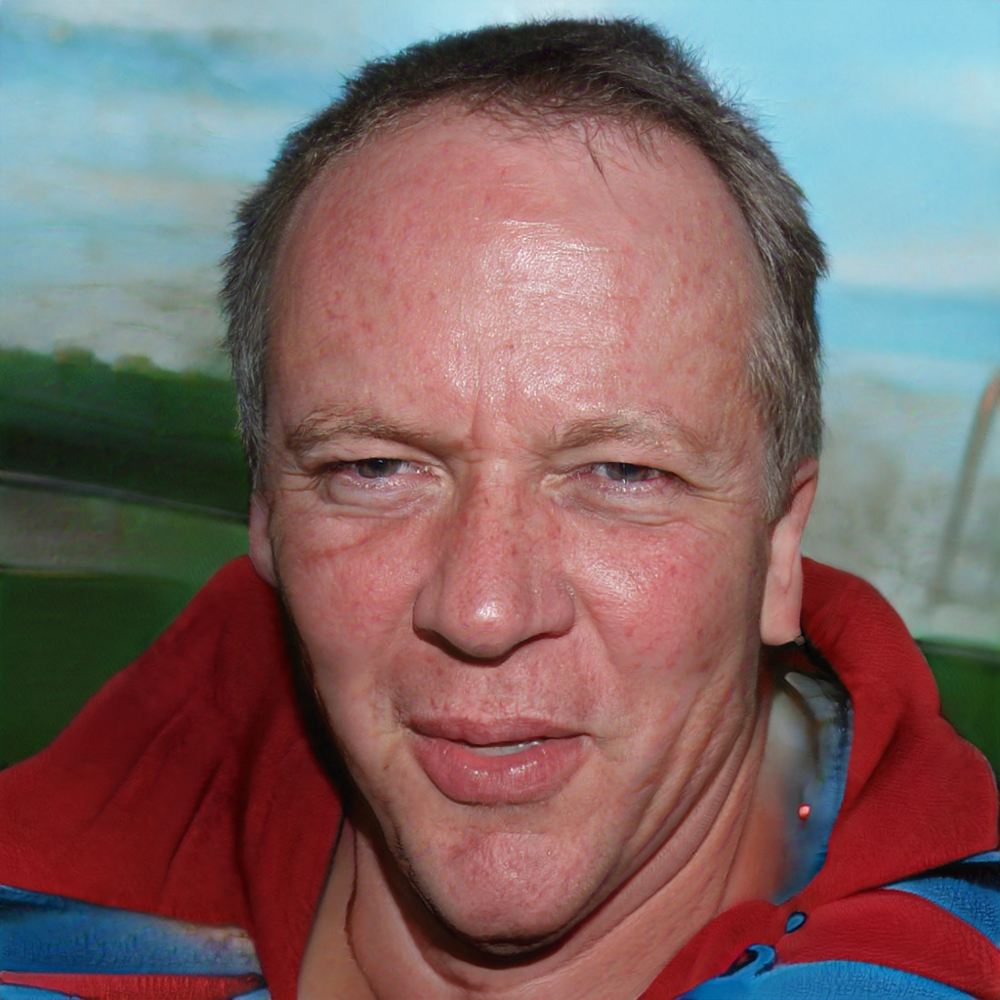

In [ ]:
import sys
sys.path.append('./stylegan3')
import pickle
import torch
import numpy as np
import PIL.Image
import urllib.request

url = "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl"
urllib.request.urlretrieve(url, "ffhq.pkl")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# Load pretrained StyleGAN2-ADA model
with open('ffhq.pkl', 'rb') as f:
    G = pickle.load(f)['G_ema'].to(device) 

# Generate random latent vector
z = torch.randn([1, G.z_dim]).to(device)

# No class labels needed
c = None

# Generate image (NCHW format)
img = G(z, c)

# Convert to HWC and numpy for visualization
img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0,255).to(torch.uint8)
img = img[0].cpu().numpy()

# Save image to disk
img = PIL.Image.fromarray(img, 'RGB')
img.save('styleGAN2_sample.png')

# Show image
img.show()


## **Evaluating StyleGAN and SORA Generations**

We can clearly observe how the facial details produced by **StyleGAN3** are significantly sharper and more realistic — from **skin texture** to **fine wrinkles around the eyes**. The level of detail is impressive. However, visible artifacts appear around the **collar region**, possibly part of a jumpsuit or jacket. These artifacts, while prominent, could go undetected if a model focuses only on facial features.

Now, let's take a look at some examples generated by **SORA**:

<div align="center">
  <img src="./Images/sora1.gif" width="300" style="margin:10px"/>
  <img src="./Images/sora3.gif" width="300" style="margin:10px"/><br>
  <img src="./Images/sora2.gif" width="300" style="margin:10px"/>
  <img src="./Images/sora4.gif" width="300" style="margin:10px"/>
</div>

These generations show how far **state-of-the-art GANs and diffusion models** have come. The difference in quality compared to traditional deepfakes is **astronomical** — even **mouth and head movements** appear highly convincing.

This raises an important challenge: a **temporal deepfake detector** would need to identify **tiny, nearly imperceptible artifacts** in motion to make accurate predictions.

So now you’re probably asking the same question we had during this project:

**Can our own detection model successfully identify these highly advanced deepfakes?**

🧠 Prediction: Real
Ground truth: fake
   Real: 99.95%
   Fake: 0.05%


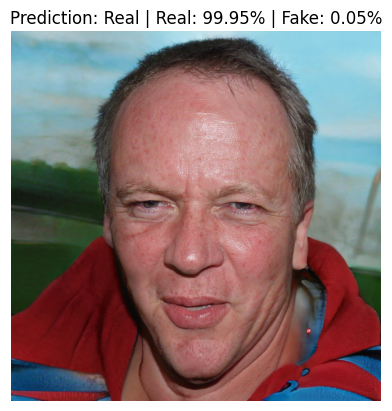

In [ ]:
import torch
import cv2
import numpy as np
from CNN_opt import CNN
import random
import matplotlib.pyplot as plt
%matplotlib inline
# Load the model
model = CNN()
model.load_state_dict(torch.load("best_cnn_opt.pth", map_location=torch.device("cpu")))
model.eval()
CLASS  = random.choice(["real","fake"])

# Load and preprocess image
img_path = "./Images/styleGAN2_sample.png"
img = cv2.imread(img_path)
rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
pil_img = Image.fromarray(rgb_img)

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])

img_transformed = transform(pil_img).unsqueeze(0)

# Predict
with torch.no_grad():
    logits = model(img_transformed)
    probs = torch.softmax(logits, dim=1).squeeze()
    real_prob = probs[0].item()
    fake_prob = probs[1].item()
    label = "Real" if real_prob > fake_prob else "Fake"

# Output
print(f"🧠 Prediction: {label}")
print("Ground truth: fake")
print(f"   Real: {real_prob:.2%}")
print(f"   Fake: {fake_prob:.2%}")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title(f"Prediction: {label} | Real: {real_prob:.2%} | Fake: {fake_prob:.2%}")
plt.axis('off')
plt.show()


🧠 Prediction: Real
Ground truth: fake
   Real: 99.64%
   Fake: 0.36%


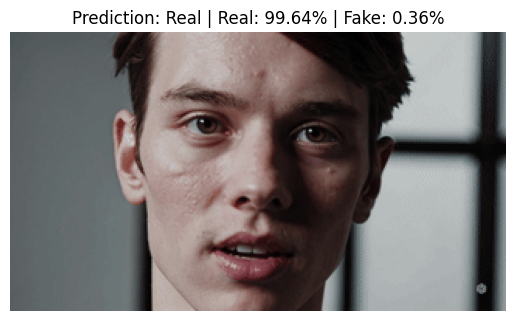

In [ ]:
# Open the GIF
gif = Image.open('./Images/sora1.gif')

# Go to the first frame (frame 0)
gif.seek(130)

# Save the frame
gif.save('./Images/SORA_sample.png')

img_path = "./Images/SORA_sample.png"
img = cv2.imread(img_path)
rgb_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
pil_img = Image.fromarray(rgb_img)

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])

img_transformed = transform(pil_img).unsqueeze(0)

# Predict
with torch.no_grad():
    logits = model(img_transformed)
    probs = torch.softmax(logits, dim=1).squeeze()
    real_prob = probs[0].item()
    fake_prob = probs[1].item()
    label = "Real" if real_prob > fake_prob else "Fake"

# Output
print(f"Prediction: {label}")
print("Ground truth: fake")
print(f"   Real: {real_prob:.2%}")
print(f"   Fake: {fake_prob:.2%}")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title(f"Prediction: {label} | Real: {real_prob:.2%} | Fake: {fake_prob:.2%}")
plt.axis('off')
plt.show()

### The Short Answer: Our Model Never Stood a Chance

Our CNN-based detector was trained exclusively on **face-swapping deepfakes**. As a result, it had **no prior exposure** to synthetic faces generated **from scratch** using advanced techniques like **stable diffusion** or **next-generation GANs** (e.g., StyleGAN3, SORA).

This highlights a critical limitation: deepfake detectors can easily **overfit to dataset-specific artifacts**, making them fragile when exposed to unfamiliar manipulation methods.

As generative models continue to evolve rapidly, **detection models must also evolve** — continuously retrained and evaluated against **diverse, up-to-date datasets** — to remain effective in real-world scenarios.


## **If you have spare time, be sure to try out our app:**

We are only using the same dataset that was used to train our model — no new or external content was introduced.  
Faces are processed frame by frame, using the same DLIB-based face extraction** pipeline, followed by identical normalization and preprocessing steps used during training.  
Despite this, the model fails to generalize properly in the app environment, and we are currently unsure why this performance gap occurs.


In [ ]:
!streamlit run ./deepfake_app.py


  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.29.241.80:8501

  Stopping...
^C
  Stopping...
gio: http://localhost:8501: Operation not supported
